In [101]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
import warnings
warnings.filterwarnings('ignore')

In [2]:
data_heatmap = pd.read_csv('../datasets/A_data_heatmap_300x250_3p.csv')
data_heatmap

,Unnamed: 0,domain,grid_id,click_x,click_y,display_height,display_width,clicks
0,0,ID_1763,333519,179,4,250,300,1
1,1,ID_1763,333519,262,185,250,300,1
2,2,ID_1763,333519,122,188,250,300,1
3,3,ID_1763,333519,263,197,250,300,1
4,4,ID_1763,333519,242,159,250,300,1
...,...,...,...,...,...,...,...,...
1935421,1935421,ID_1501,333519,163,145,250,300,8
1935422,1935422,ID_1501,333519,41,139,250,300,4
1935423,1935423,ID_1501,333519,213,97,250,300,2
1935424,1935424,ID_1501,333519,271,245,250,300,1


In [3]:
# expand so that each row corresponds to 1 click:
data_heatmap_expanded = data_heatmap.loc[data_heatmap.index.repeat(data_heatmap['clicks'])].reset_index(drop=True)
data_heatmap_expanded['clicks'] = 1 

In [4]:
# Binning clicks in nr_of_x_bins, nr_of_y_bins:

NR_OF_X_BINS = 61
NR_OF_Y_BINS = 51

max_width = data_heatmap['display_width'].max()
max_height = data_heatmap['display_height'].max()

width_bins = np.linspace(1, max_width, NR_OF_X_BINS)
height_bins = np.linspace(1, max_height, NR_OF_Y_BINS)

width_bins_max = len(width_bins)-2 # start at 0
height_bins_max = len(height_bins)-2

data_heatmap_expanded['click_x_bin'] = pd.cut(data_heatmap_expanded['click_x'], 
                                      bins   = width_bins, 
                                      labels = False, 
                                      include_lowest = True)

data_heatmap_expanded['click_y_bin'] = pd.cut(data_heatmap_expanded['click_y'], 
                                      bins = height_bins, 
                                      labels = False, 
                                      include_lowest = True)


aggregated_clicks = data_heatmap_expanded.groupby(['grid_id',
                                           'domain', 
                                           'click_x_bin', 
                                           'click_y_bin']).size().reset_index(name='clicks_sum')


In [5]:
cb_333519 = ['ID_1184', 'ID_1281', 'ID_1305', 'ID_1353', 'ID_1448', 'ID_1522',
       'ID_1544', 'ID_162', 'ID_1682', 'ID_1690', 'ID_1824', 'ID_1888',
       'ID_1929', 'ID_2076', 'ID_2097', 'ID_2226', 'ID_2249', 'ID_2268',
       'ID_2331', 'ID_2339', 'ID_2386', 'ID_2396', 'ID_2438', 'ID_258',
       'ID_2609', 'ID_2680', 'ID_2863', 'ID_2883', 'ID_2908', 'ID_3061',
       'ID_3243', 'ID_3250', 'ID_3314', 'ID_3382', 'ID_3397', 'ID_3402',
       'ID_3420', 'ID_3459', 'ID_3470', 'ID_3540', 'ID_398', 'ID_409',
       'ID_484', 'ID_489', 'ID_526', 'ID_549', 'ID_580', 'ID_665',
       'ID_810', 'ID_84', 'ID_857', 'ID_86', 'ID_905', 'ID_927', 'ID_934',
       'ID_962', 'ID_986', 'ID_10', 'ID_1077', 'ID_1178', 'ID_1203', 'ID_1246', 
       'ID_1262', 'ID_1671', 'ID_1691', 'ID_1999', 'ID_2198', 'ID_2495', 
       'ID_2569', 'ID_2619', 'ID_3180', 'ID_3308', 'ID_394', 'ID_678', 'ID_793']

cb_333346 = ['ID_1247', 'ID_162', 'ID_2534', 'ID_2742', 'ID_526', 'ID_2201',
       'ID_1165', 'ID_743', 'ID_199', 'ID_2145', 'ID_2569', 'ID_643',
       'ID_1305', 'ID_3180', 'ID_3158', 'ID_136', 'ID_293', 'ID_1753',
       'ID_1849', 'ID_2226', 'ID_1462', 'ID_626', 'ID_2863', 'ID_3243',
       'ID_3250', 'ID_1708', 'ID_1238', 'ID_580', 'ID_84', 'ID_2568',
       'ID_2340', 'ID_1803', 'ID_3470', 'ID_139', 'ID_2619', 'ID_2908',
       'ID_1281', 'ID_3308', 'ID_2883', 'ID_1320', 'ID_1333', 'ID_1062',
       'ID_149', 'ID_260', 'ID_599', 'ID_1513', 'ID_3402', 'ID_1888',
       'ID_2972', 'ID_398', 'ID_2339', 'ID_1030', 'ID_3382', 'ID_2076',
       'ID_1646', 'ID_1077', 'ID_10', 'ID_1153', 'ID_1533', 'ID_2609',
       'ID_1214', 'ID_810', 'ID_2097', 'ID_2386', 'ID_1585', 'ID_549',
       'ID_3420', 'ID_3397', 'ID_2006', 'ID_561', 'ID_1542', 'ID_1570',
       'ID_1819', 'ID_1413', 'ID_1240', 'ID_793', 'ID_831', 'ID_3188',
       'ID_1437', 'ID_556', 'ID_1134', 'ID_314', 'ID_2836', 'ID_1483',
       'ID_2676', 'ID_665', 'ID_15', 'ID_2755', 'ID_2194', 'ID_1682',
       'ID_2775', 'ID_1923', 'ID_1846', 'ID_1262', 'ID_3314', 'ID_1448',
       'ID_1770', 'ID_2626', 'ID_3296', 'ID_489', 'ID_1963', 'ID_1268',
       'ID_1568', 'ID_1094', 'ID_2267', 'ID_409', 'ID_1650', 'ID_1522',
       'ID_927', 'ID_2302', 'ID_1929', 'ID_1435', 'ID_1353', 'ID_1071', 
       'ID_1246', 'ID_1300', 'ID_1358', 'ID_1614', 'ID_1894', 'ID_1999', 
       'ID_2142', 'ID_2198', 'ID_2274', 'ID_2331', 'ID_2400', 'ID_2438', 
       'ID_2495', 'ID_2710', 'ID_2808', 'ID_3197', 'ID_3335', 'ID_418', 
       'ID_657', 'ID_773', 'ID_906', 'ID_962']

In [6]:
def plot_anomaly(n_rows, n_cols, anomaly, aggregated_clicks):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 12))  # Adjust the figure size as needed
    fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust spacing between plots

    plot_count = 0

    for grid, domain in anomaly:
        ex = aggregated_clicks[(aggregated_clicks.grid_id == grid) &
                            (aggregated_clicks.domain == domain)]
        if len(ex) == 0: # skips the entries that are not in heatmap data 
            continue

        click_matrix = ex.pivot("click_y_bin", "click_x_bin", "clicks_sum").fillna(0)
        
        if plot_count == n_rows * n_cols:  # Check if the figure is full
            #plt.savefig(f'heatmap_combined_{idx}.png', bbox_inches='tight')  # Save current figure
            plt.show()
            fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 12))  # Start a new figure
            fig.subplots_adjust(hspace=0.4, wspace=0.4)
            plot_count = 0  # Reset plot count for the new figure

        row = plot_count // n_cols
        col = plot_count % n_cols
        
        ax = axes[row, col]
        sns.heatmap(click_matrix, 
                    cmap="YlGnBu", 
                    annot=False, 
                    cbar=True, 
                    fmt="g", 
                    ax=ax)
        ax.set_title(f'grid = {grid} and domain = {domain}')
        ax.set_xlabel('click_x Bin')
        ax.set_ylabel('click_y Bin')
        ax.invert_yaxis()
        
        plot_count += 1

    if plot_count > 0:
    #    plt.savefig(f'heatmap_combined_final.png', bbox_inches='tight')
        plt.show()

In [7]:
# 333519
cluster_333519 = {
      'c1': ['ID_1184', 'ID_1353', 'ID_162', 'ID_1682', 'ID_1824', 'ID_1888', 'ID_1929', 'ID_2076', 'ID_2226', 'ID_2268', 
            'ID_2331', 'ID_2438', 'ID_258', 'ID_2680', 'ID_3250', 'ID_3397', 'ID_1671'], # all over the place
      'c2': ['ID_1281', 'ID_1305', 'ID_1544', 'ID_3243', 'ID_3382', 'ID_3402', 'ID_3459', 'ID_398', 'ID_549', 'ID_580', 
             'ID_810', 'ID_905', 'ID_986', 'ID_10', 'ID_1077', 'ID_1178', 'ID_1203', 'ID_1262', 'ID_1691', 'ID_1999', 
             'ID_2198', 'ID_2495', 'ID_2569', 'ID_2619', 'ID_3180', 'ID_394', 'ID_678', 'ID_793'], # left bottom corner
      'c3': ['ID_1690', 'ID_2249', 'ID_2908', 'ID_3470', 'ID_3540', 'ID_409', 'ID_484', 'ID_489', 'ID_86', 'ID_927', 
             'ID_934', 'ID_1246', 'ID_3308'], # right bottom corner
      'c4': ['ID_1448', 'ID_1522', 'ID_2609', 'ID_2863', 'ID_2883', 'ID_3314', 'ID_857'], # bottom middle
      'c5': ['ID_2339', 'ID_2386'], # right middle
      'c6': ['ID_962'] # top right corner
}

# 'ID_2097', 'ID_2396', 'ID_3061', 'ID_3420', 'ID_526', 'ID_665', 'ID_84' # undefined

#333346
cluster_333346 = {
      'c1': ['ID_1247', 'ID_199', 'ID_2226', 'ID_1462', 'ID_1320', 'ID_1333', 'ID_149', 'ID_1513', 'ID_1888', 'ID_1153', 
            'ID_549', 'ID_3397', 'ID_1413', 'ID_2676', 'ID_2775', 'ID_1650', 'ID_2438'], # all over the place
      'c2': ['ID_2742', 'ID_526', 'ID_2569', 'ID_3180', 'ID_1753', 'ID_3243', 'ID_1238', 'ID_580', 'ID_84', 'ID_2619', 
            'ID_1281', 'ID_3402', 'ID_398', 'ID_1030', 'ID_3382', 'ID_1077', 'ID_10', 'ID_810', 'ID_561', 'ID_1240', 
            'ID_793', 'ID_1437', 'ID_556', 'ID_1483', 'ID_1262', 'ID_1435', 'ID_1999', 'ID_2198', 'ID_2495'], # left bottom corner
      'c7': ['ID_2534', 'ID_2201', 'ID_2145', 'ID_3158', 'ID_139', 'ID_1646', 'ID_1533', 'ID_2755'], # all over left side
      'c4': ['ID_1165', 'ID_643', 'ID_1305', 'ID_293', 'ID_2883', 'ID_260', 'ID_2609', 'ID_1214', 'ID_1542', 'ID_1570', 
            'ID_1819', 'ID_831', 'ID_1134', 'ID_2836', 'ID_3314', 'ID_1448', 'ID_1568', 'ID_1094', 'ID_2400'], # mid bottom
      'c8': ['ID_743', 'ID_2568', 'ID_1062', 'ID_2626'], # Diagonal 
      'c3': ['ID_1803', 'ID_3470', 'ID_3308', 'ID_2006', 'ID_1894', 'ID_3197', 'ID_3335', 'ID_906', 'ID_1708', 'ID_2908', 
            'ID_489', 'ID_409', 'ID_927', 'ID_1071', 'ID_1246', 'ID_1358', 'ID_1614', 'ID_2142', 'ID_2331', 'ID_2710', 'ID_2808'] # right bottom corner 44-50
}

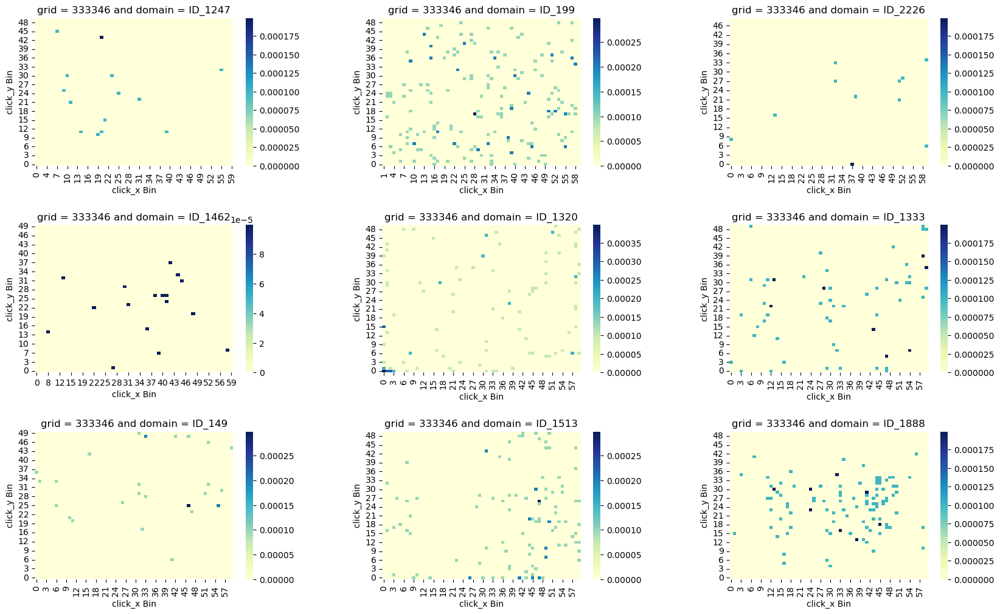

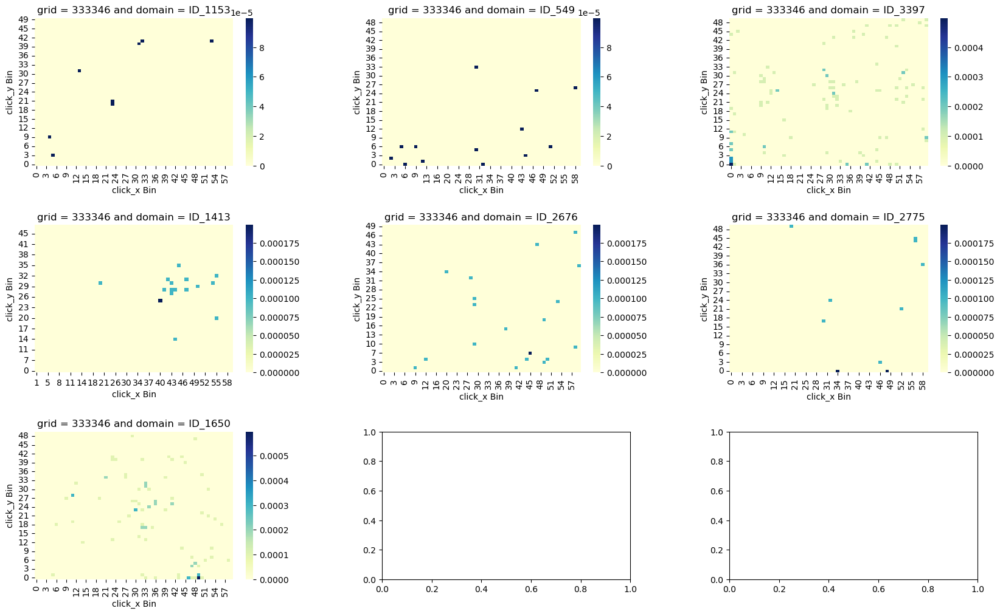

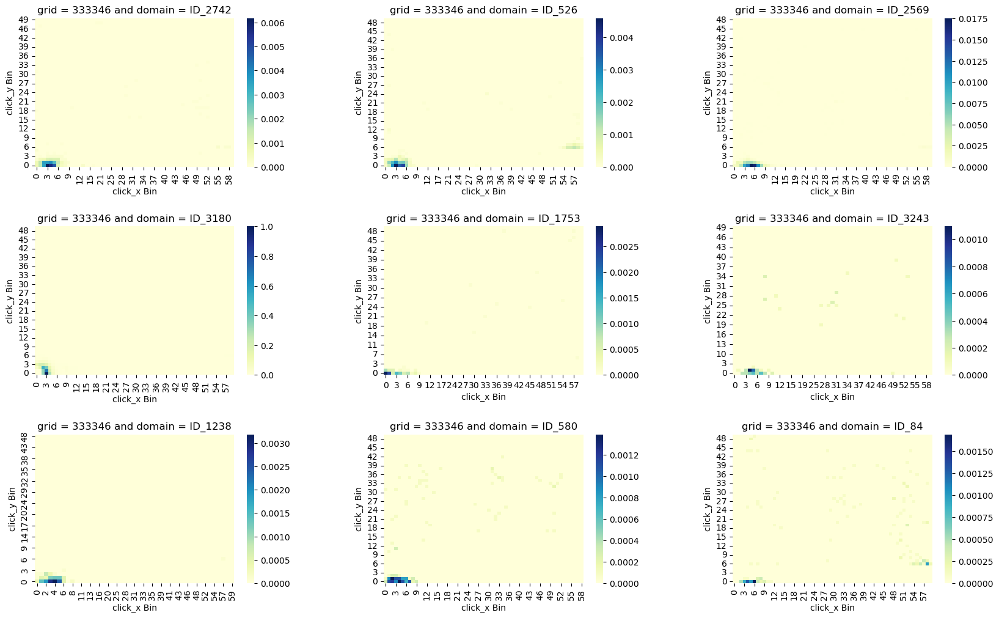

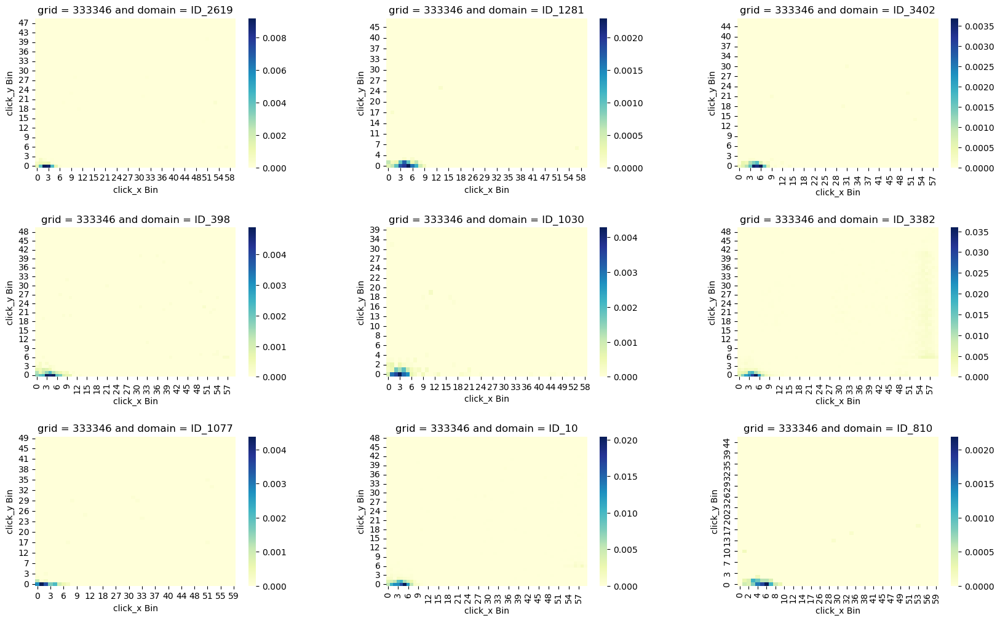

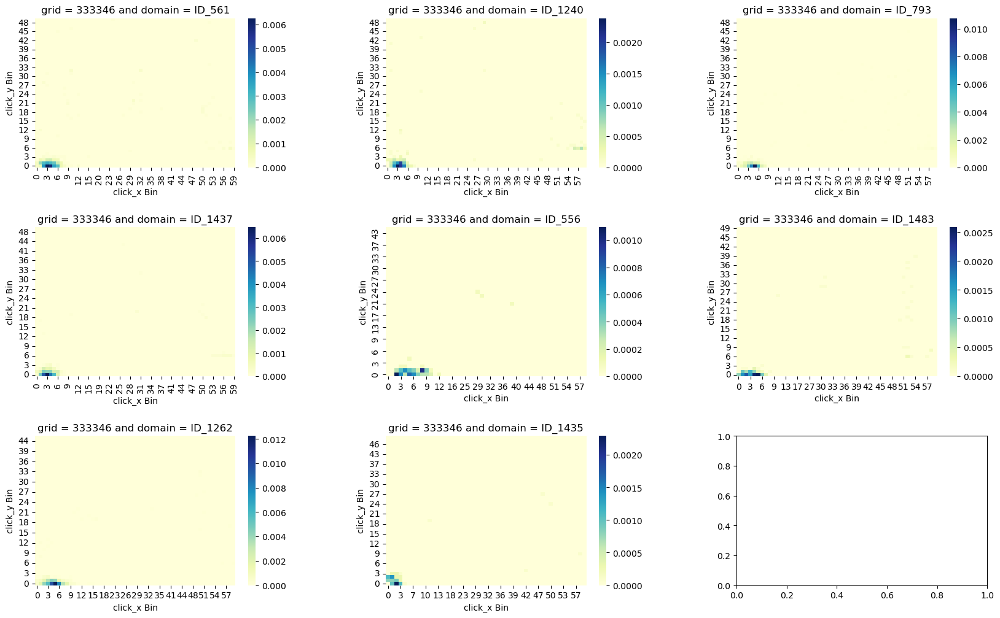

...

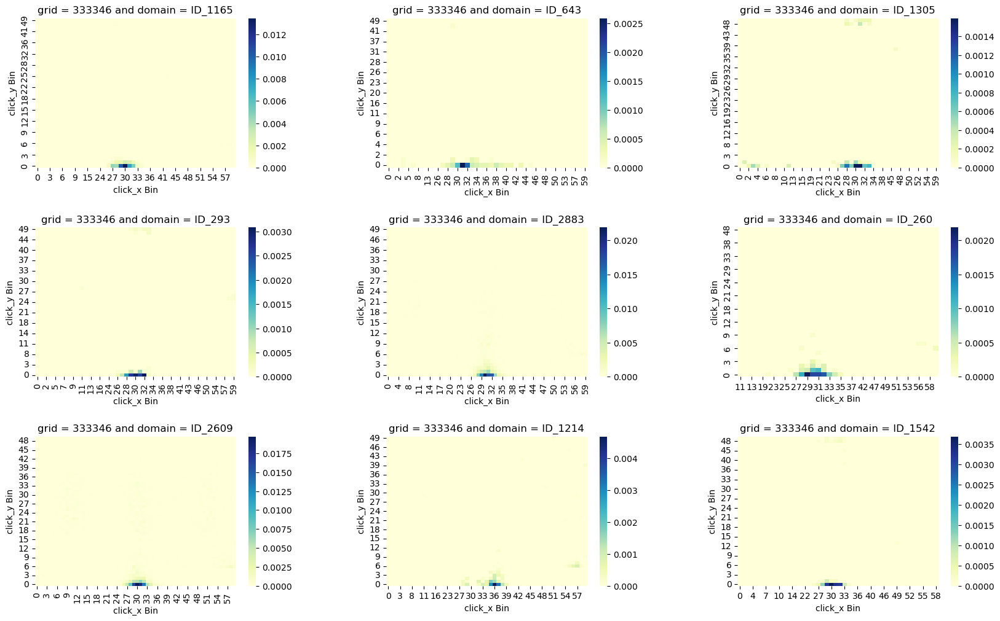

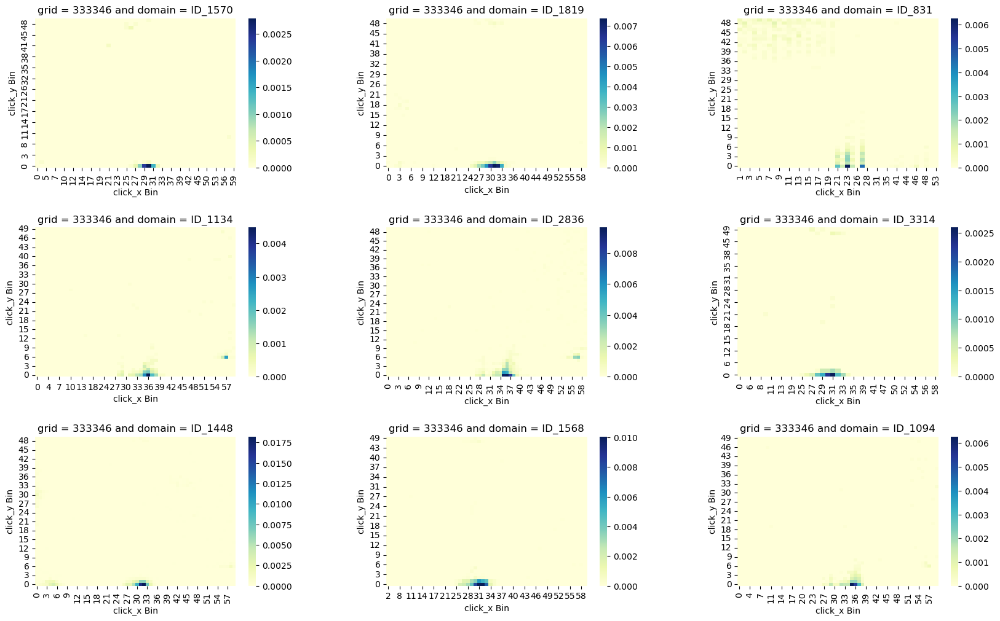

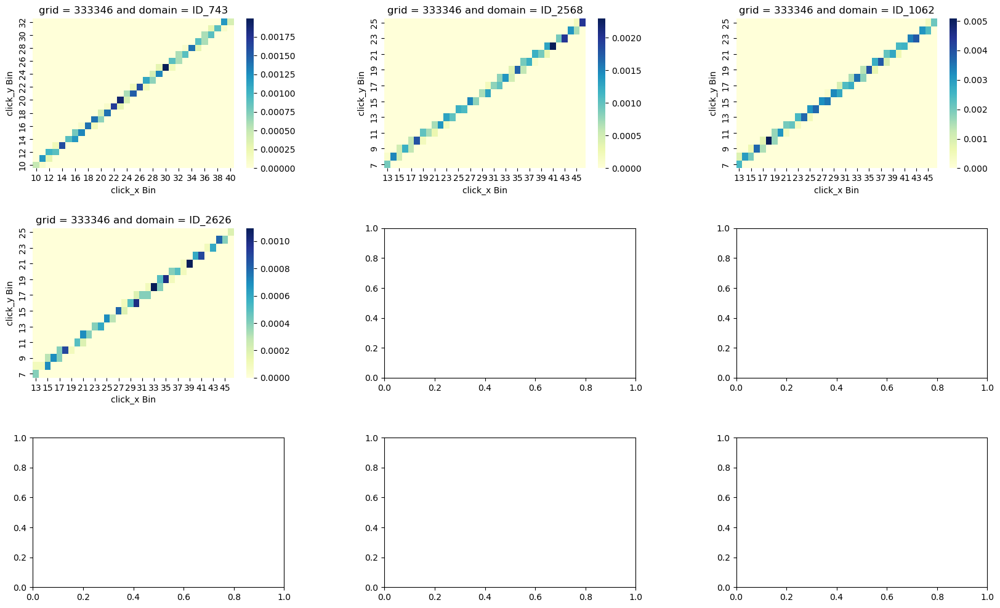

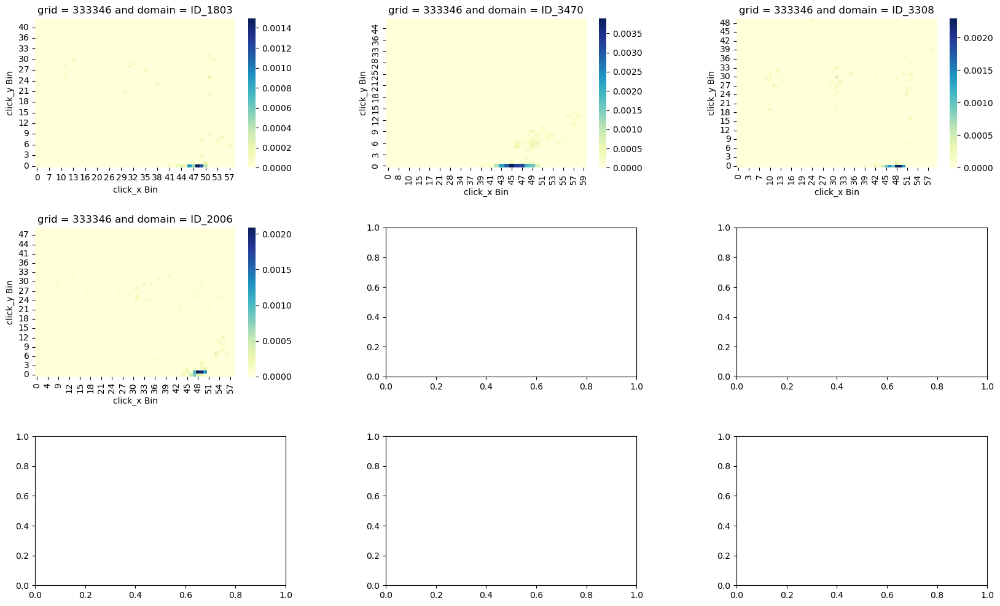

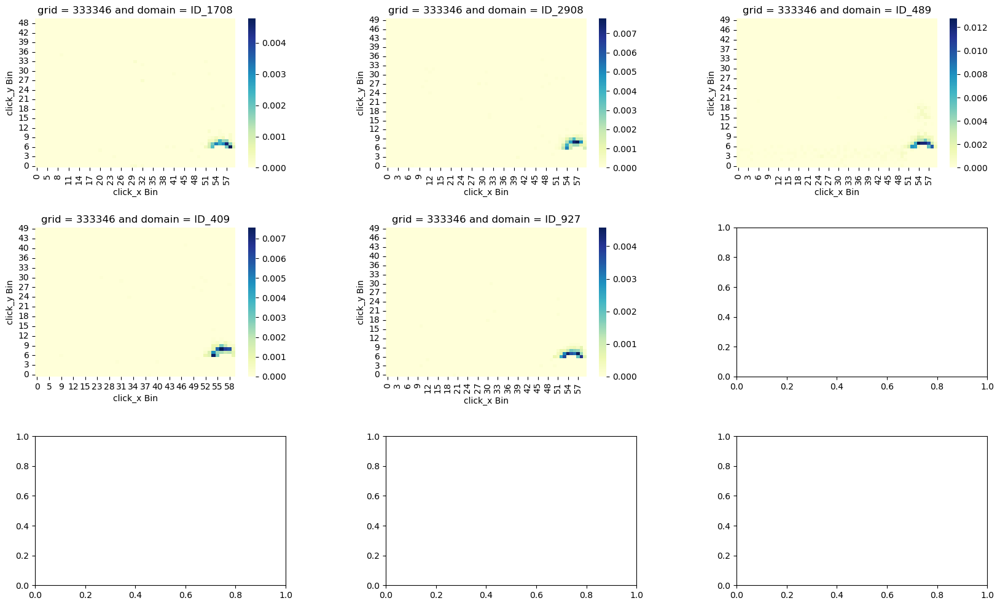

In [ ]:
for key, value in cluster_333346.items():
    plot_anomaly(3,3,[[333346, x] for x in value], df)

In [8]:
# def calculate_centroid(heatmap):
#     total_intensity = heatmap.clicks_sum.sum()
#     centroid_x = (heatmap.click_x_bin * heatmap.clicks_sum).sum() / total_intensity
#     centroid_y = (heatmap.click_y_bin * heatmap.clicks_sum).sum() / total_intensity
#     return [centroid_x, centroid_y]

# calculate_centroid(aggregated_clicks[(aggregated_clicks.domain == 'ID_1281') & (aggregated_clicks.grid_id == 333519)])


[17.05531914893617, 10.05531914893617]

In [8]:
# normalize clicks
df = aggregated_clicks
# df['clicks_sum'] =  (df['clicks_sum'] - df['clicks_sum'].min()) / (df['clicks_sum'].max() - df['clicks_sum'].min())

group_sum = df.groupby(['grid_id', 'domain'])['clicks_sum'].transform('sum')
# Normalize 'clicks_sum' by the group sum
df['clicks_sum'] = df['clicks_sum'] / group_sum

group_squares_sum = df.groupby(['grid_id', 'domain'])['clicks_sum'].transform(lambda x: math.sqrt((x**2).sum()))
# Divide by the sum of squares (norm) for each group
df['clicks_sum'] = df['clicks_sum'] / group_squares_sum

In [9]:
data = [(333519, key, value) for key, value_list in cluster_333519.items() for value in value_list]
df_cluster = pd.DataFrame(data, columns=['grid_id', 'cluster', 'domain'])
data1 = [(333346, key, value) for key, value_list in cluster_333346.items() for value in value_list]
df_cluster1 = pd.DataFrame(data1, columns=['grid_id', 'cluster', 'domain'])
cluster_all = pd.concat([df_cluster, df_cluster1], axis = 0)

In [11]:
# centroids = {}
# groups = cluster_all.groupby(['cluster'])
# for cluster, group in groups:
#     centroids[cluster] = calculate_centroid(pd.merge(df, group, on=['grid_id', 'domain'], how='inner'))

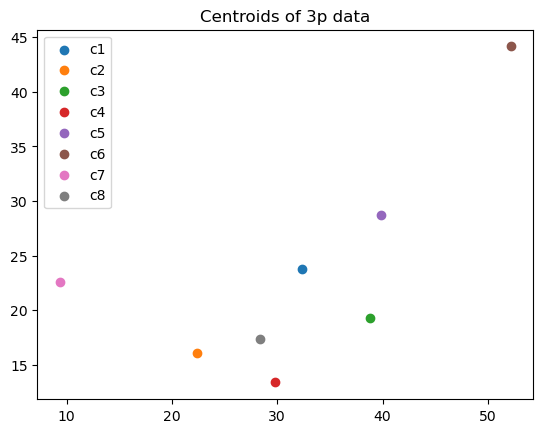

In [ ]:
# for key, (x, y) in centroids.items():
#     plt.scatter(x, y, label=key)

# plt.legend()
# plt.title('Centroids of 3p data')
# plt.show()

In [10]:
data_heatmap_t2m = pd.read_csv('../datasets/A_data_heatmap_300x250_6p_t2m.csv')
data_heatmap_h2m = pd.read_csv('../datasets/A_data_heatmap_300x250_6p_h2m.csv')

data_heatmap = pd.concat([data_heatmap_t2m, data_heatmap_h2m])
data_heatmap

,Unnamed: 0,domain,grid_id,click_x,click_y,display_height,display_width,clicks,click_x_rel,click_y_rel
0,2000000,ID_2674,333346,62,137,250,300,1,8.0,22.0
1,2000001,ID_2674,333346,66,93,250,300,1,9.0,15.0
2,2000002,ID_2674,333346,249,154,250,300,1,33.0,25.0
3,2000003,ID_2674,333346,86,156,250,300,1,11.0,25.0
4,2000004,ID_2674,333346,71,131,250,300,1,9.0,21.0
...,...,...,...,...,...,...,...,...,...,...
1999995,1999995,ID_2674,333346,43,140,250,300,1,6.0,22.0
1999996,1999996,ID_2674,333346,215,140,250,300,1,29.0,22.0
1999997,1999997,ID_2674,333346,149,129,250,300,1,20.0,21.0
1999998,1999998,ID_2674,333346,228,113,250,300,1,30.0,18.0


In [11]:
# expand so that each row corresponds to 1 click:
data_heatmap_expanded = data_heatmap.loc[data_heatmap.index.repeat(data_heatmap['clicks'])].reset_index(drop=True)
data_heatmap_expanded['clicks'] = 1 

In [12]:
# Binning clicks in nr_of_x_bins, nr_of_y_bins:

NR_OF_X_BINS = 61
NR_OF_Y_BINS = 51

max_width = data_heatmap['display_width'].max()
max_height = data_heatmap['display_height'].max()

width_bins = np.linspace(1, max_width, NR_OF_X_BINS)
height_bins = np.linspace(1, max_height, NR_OF_Y_BINS)

width_bins_max = len(width_bins)-2 # start at 0
height_bins_max = len(height_bins)-2

data_heatmap_expanded['click_x_bin'] = pd.cut(data_heatmap_expanded['click_x'], 
                                      bins   = width_bins, 
                                      labels = False, 
                                      include_lowest = True)

data_heatmap_expanded['click_y_bin'] = pd.cut(data_heatmap_expanded['click_y'], 
                                      bins = height_bins, 
                                      labels = False, 
                                      include_lowest = True)


df_new = data_heatmap_expanded.groupby(['grid_id',
                                           'domain', 
                                           'click_x_bin', 
                                           'click_y_bin']).size().reset_index(name='clicks_sum')


In [13]:
# normalize clicks
# df_new['clicks_sum'] =  (df_new['clicks_sum'] - df_new['clicks_sum'].min()) / (df_new['clicks_sum'].max() - df_new['clicks_sum'].min())

group_sum = df_new.groupby(['grid_id', 'domain'])['clicks_sum'].transform('sum')
# Normalize 'clicks_sum' by the group sum
df_new['clicks_sum'] = df_new['clicks_sum'] / group_sum

group_squares_sum = df_new.groupby(['grid_id', 'domain'])['clicks_sum'].transform(lambda x: math.sqrt((x**2).sum()))
# Divide by the sum of squares (norm) for each group
df_new['clicks_sum'] = df_new['clicks_sum'] / group_squares_sum

In [14]:
def cosine_similarity(vector_a, vector_b):
    dot_product = np.dot(vector_a, vector_b)
    norm_a = np.linalg.norm(vector_a)
    norm_b = np.linalg.norm(vector_b)
    similarity = dot_product / (norm_a * norm_b)
    return similarity

In [18]:
# import math

# dis = []

# groups = df_new.groupby(['grid_id', 'domain'])
# for (grid_id, domain), group in groups:
#     current_centroid = calculate_centroid(df_new[(df_new.grid_id == grid_id) & (df_new.domain == domain)])

#     for cluster, previous_centroid in centroids.items():
#         distance = math.sqrt(sum((a - b) ** 2 for a, b in zip(current_centroid, previous_centroid))) # Euclidean distance
#         # distance = cosine_similarity(current_centroid, previous_centroid) # cosine similarity
#         dis.append((grid_id, domain, cluster, distance))


In [19]:
# threshold = 2
# anomaly = [row for row in dis if row[3] < threshold]
# # threshold = 0.99999
# # anomaly = [row for row in dis if row[3] > threshold]

In [ ]:
# anomaly_ = {(row[0], row[1]) for row in anomaly}
# len(anomaly_)

200

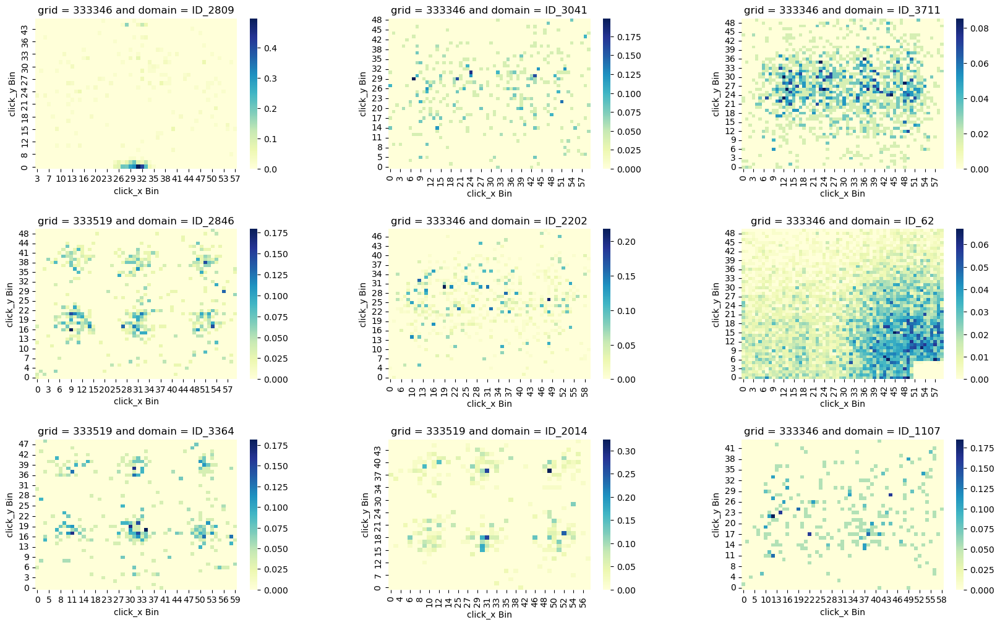

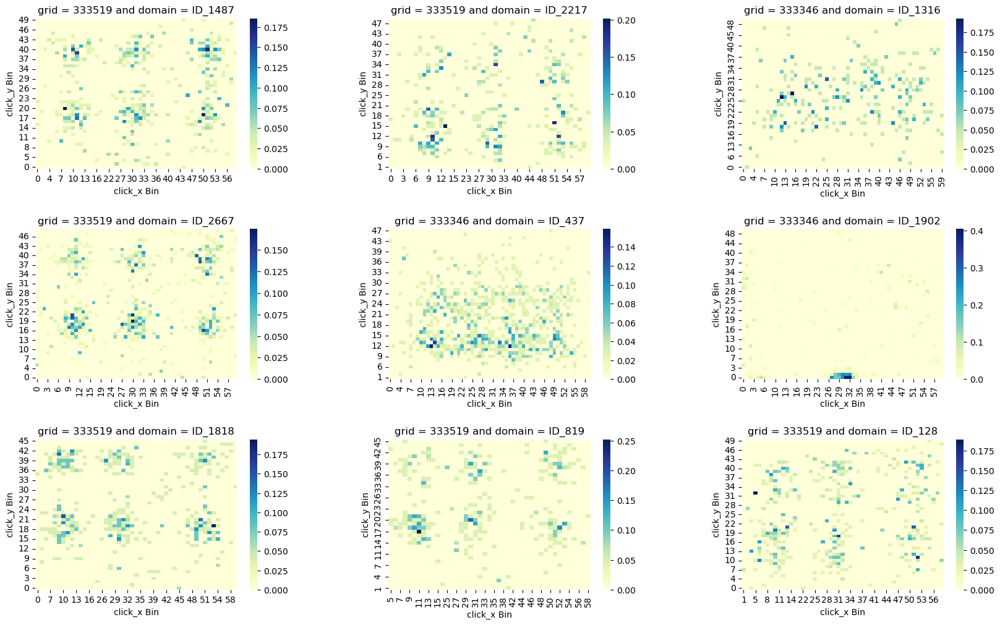

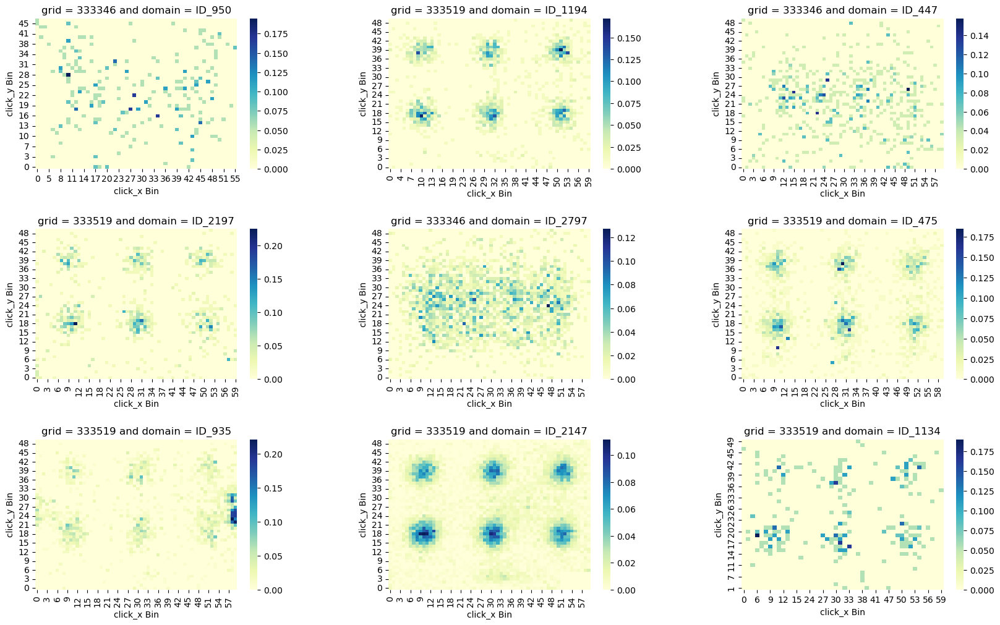

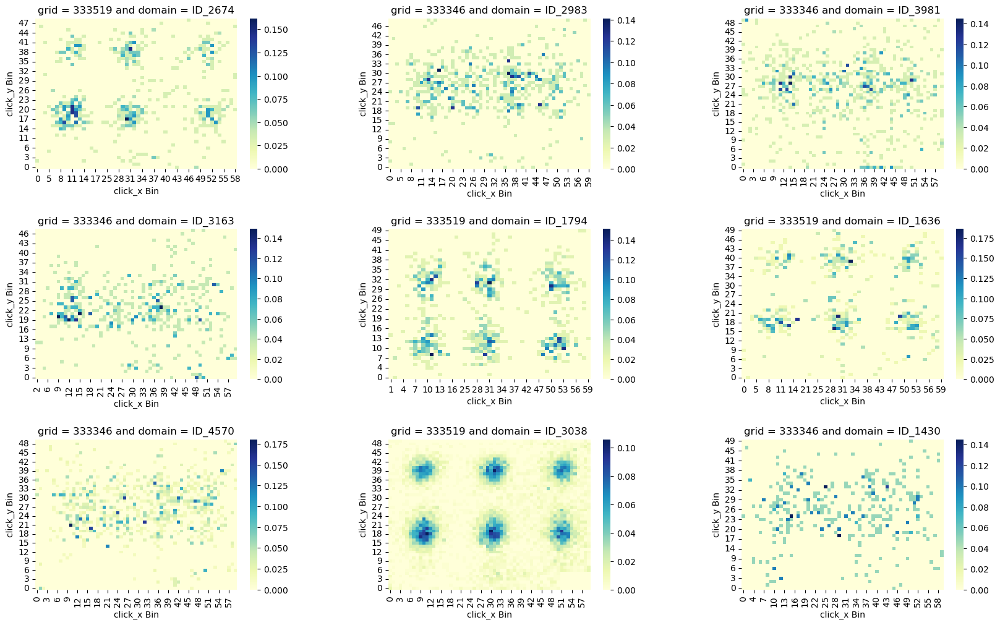

KeyboardInterrupt: 

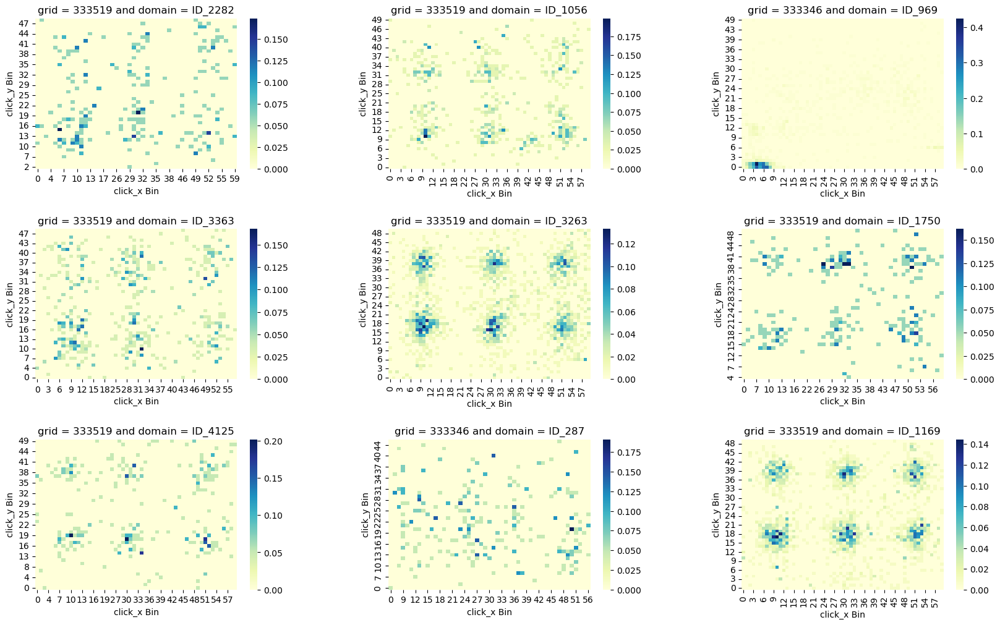

In [ ]:
# plot_anomaly(3,3,anomaly_, df_new)

In [20]:
# cb_333346_6p = ['ID_106', 'ID_1003', 'ID_1081', 'ID_1108', 'ID_1111', 'ID_1150', 'ID_1217', 'ID_1303', 'ID_1347', 
#                 'ID_136', 'ID_1464', 'ID_1542', 'ID_1579', 'ID_1589', 'ID_1602', 'ID_1624','ID_1640', 'ID_1731',
#                 'ID_185', 'ID_1902', 'ID_1908', 'ID_1915', 'ID_1916', 'ID_1917','ID_1971', 'ID_1974', 'ID_2015', 
#                 'ID_2063', 'ID_2077', 'ID_2099', 'ID_2104', 'ID_2108', 'ID_2133', 'ID_2143', 'ID_2214', 'ID_2242',
#                 'ID_2279', 'ID_2336', 'ID_2337', 'ID_2368', 'ID_2400', 'ID_2404', 'ID_243', 'ID_2435', 'ID_245', 
#                 'ID_2553', 'ID_2564', 'ID_2598', 'ID_2626', 'ID_2627', 'ID_2635', 'ID_2636', 'ID_2648', 'ID_267', 
#                 'ID_2693', 'ID_27', 'ID_2737', 'ID_2750', 'ID_2760', 'ID_2762', 'ID_2766', 'ID_2779', 'ID_2809', 
#                 'ID_2867', 'ID_2881', 'ID_2924', 'ID_2933', 'ID_2977', 'ID_3019', 'ID_3098', 'ID_313', 'ID_3157', 
#                 'ID_3172', 'ID_3178', 'ID_3219', 'ID_3231', 'ID_324', 'ID_3268', 'ID_3308', 'ID_333', 'ID_3334', 
#                 'ID_3375', 'ID_3389', 'ID_3405', 'ID_3418', 'ID_3472', 'ID_3487', 'ID_3526', 'ID_3535', 'ID_3567',
#                 'ID_3605', 'ID_3614', 'ID_362', 'ID_3633', 'ID_3640', 'ID_3644', 'ID_365', 'ID_367', 'ID_3672', 
#                 'ID_3699', 'ID_3726', 'ID_3730', 'ID_3781', 'ID_3799', 'ID_3800', 'ID_3809', 'ID_3837', 'ID_3848', 
#                 'ID_3850', 'ID_389', 'ID_3917', 'ID_3920', 'ID_3939', 'ID_3982', 'ID_401', 'ID_4016', 'ID_4040',
#                 'ID_4042', 'ID_4058', 'ID_4072', 'ID_4076', 'ID_4199', 'ID_4204', 'ID_4206', 'ID_4224', 'ID_4275',
#                 'ID_429', 'ID_4347', 'ID_4378', 'ID_4507', 'ID_4567','ID_466', 'ID_494', 'ID_514', 'ID_539', 
#                 'ID_582', 'ID_62', 'ID_71', 'ID_727', 'ID_731', 'ID_737', 'ID_825', 'ID_861', 'ID_869', 'ID_876', 
#                 'ID_889', 'ID_90', 'ID_922', 'ID_949', 'ID_969', 'ID_979', 'ID_981', 'ID_993']
# cb_333519_6p = ['ID_1081', 'ID_1150', 'ID_1464', 'ID_1518', 'ID_1622', 'ID_1623', 'ID_1624', 'ID_1631', 'ID_1678', 
#                 'ID_1623', 'ID_1731', 'ID_1752', 'ID_1764', 'ID_1795', 'ID_1915', 'ID_1916', 'ID_1971', 'ID_198', 
#                 'ID_2018', 'ID_204', 'ID_2044', 'ID_2104', 'ID_2108', 'ID_2109', 'ID_2146', 'ID_2251', 'ID_2330', 
#                 'ID_2336', 'ID_2381', 'ID_2383', 'ID_2400', 'ID_2616', 'ID_2636', 'ID_2749', 'ID_2766', 'ID_2779', 
#                 'ID_2809', 'ID_284', 'ID_2875', 'ID_2881', 'ID_30', 'ID_3021', 'ID_3049', 'ID_3098', 'ID_3178', 
#                 'ID_3183', 'ID_3219', 'ID_3232', 'ID_3561', 'ID_3644', 'ID_365', 'ID_3850', 'ID_389', 'ID_4025', 
#                 'ID_4036', 'ID_4050', 'ID_4058', 'ID_4075', 'ID_4113', 'ID_4122', 'ID_4255', 'ID_4257', 'ID_4275', 
#                 'ID_4347', 'ID_44', 'ID_4506', 'ID_4567', 'ID_618', 'ID_727', 'ID_737', 'ID_922', 'ID_950', 'ID_960', 
#                 'ID_969']

In [ ]:
# anomaly = pd.DataFrame(anomaly, columns=['grid_id', 'domain', 'cluster', 'similarity'])
# anomaly = anomaly.loc[anomaly.groupby(['grid_id', 'domain'])['similarity'].idxmax()]
# anomaly['clearly_broken'] = 0
# anomaly.loc[(anomaly.grid_id  == 333519) & (anomaly.domain.isin(cb_333519_6p)), 'clearly_broken'] = 1
# anomaly.loc[(anomaly.grid_id  == 333346) & (anomaly.domain.isin(cb_333346_6p)), 'clearly_broken'] = 1

In [ ]:
# len(anomaly[anomaly.clearly_broken==1])

31

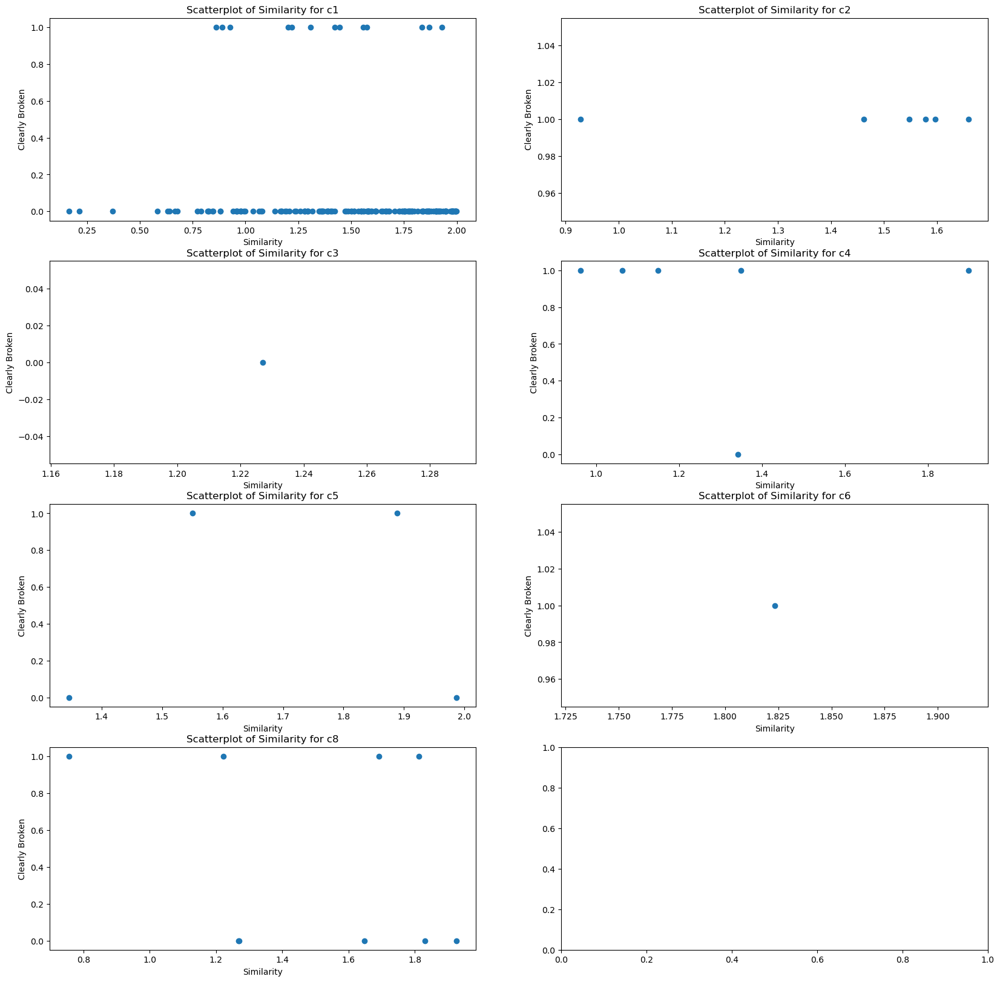

In [ ]:
# fig, axes = plt.subplots(4, 2, figsize=(20, 20))
# for ax, (group_name, group_data) in zip(axes.flatten(), anomaly.groupby('cluster')):
#     ax.scatter(group_data['similarity'], group_data['clearly_broken'])
#     ax.set_ylabel('Clearly Broken')
#     ax.set_xlabel('Similarity')
#     ax.set_title(f'Scatterplot of Similarity for {group_name}')
# plt.show()


# Modified

In [16]:
# maps for each broken clusters by mean
cluster_map = {}
groups = cluster_all.groupby(['cluster'])
for cluster, group in groups:
    cluster_data = pd.merge(df, group, on=['grid_id', 'domain'], how='inner')
    cluster_data = cluster_data.groupby(['click_x_bin', 'click_y_bin'], as_index=False)['clicks_sum'].mean()
    current_map = np.zeros((50, 60))
    for _, row in cluster_data.iterrows():
        current_map[int(row['click_y_bin']), int(row['click_x_bin'])] = row['clicks_sum']
    cluster_map[cluster] = current_map

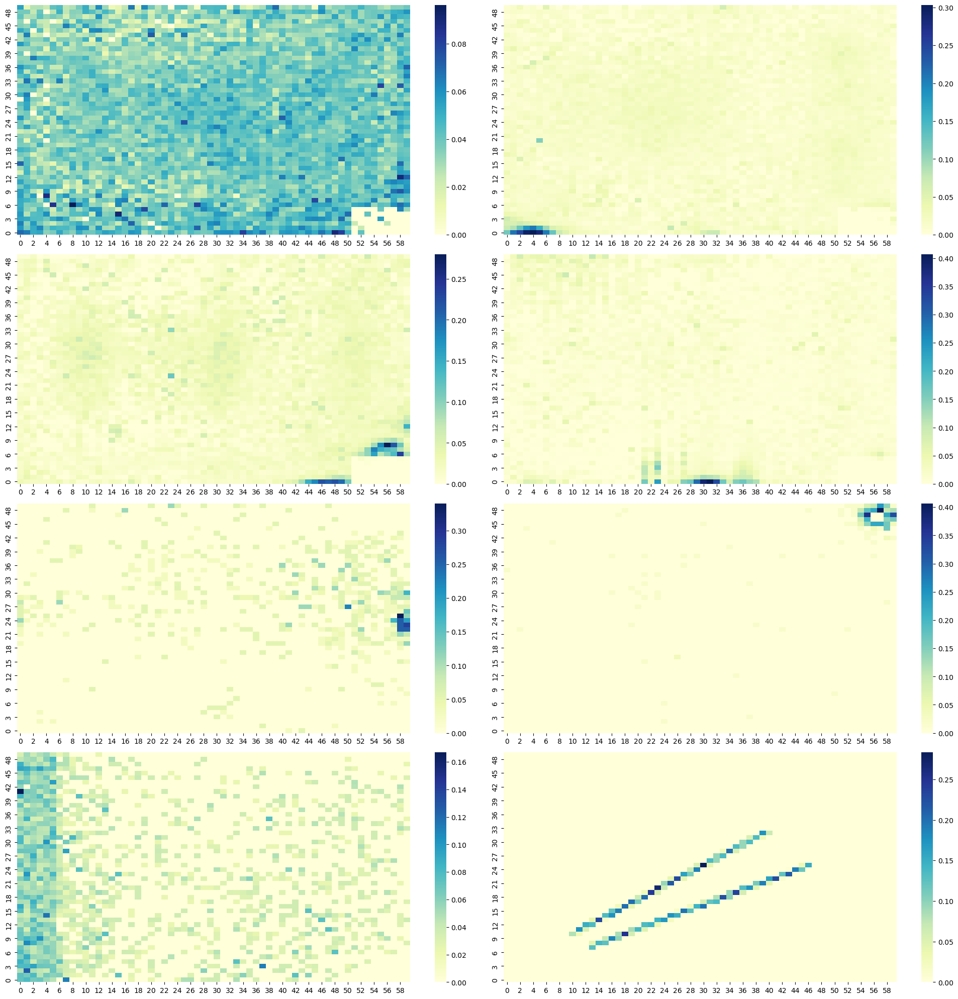

In [17]:
# plot cluster_map
fig, axes = plt.subplots(4, 2, figsize=(20, 20))
for i, k in enumerate(cluster_map.keys()):
    # click_matrix = cluster_map[k].pivot("click_y_bin", "click_x_bin", "clicks_sum").fillna(0)
    # cluster_map[k] = click_matrix
    ax = axes[i // 2, i % 2]
    sns.heatmap(cluster_map[k], cmap="YlGnBu", annot=False, cbar=True, fmt="g", ax=ax)
    ax.invert_yaxis()
plt.tight_layout()
plt.show()

In [24]:
# similarity between each heatmap in 3p data and cluster_map
sim_old = []
groups = df.groupby(['grid_id', 'domain'])
for (grid_id, domain), group in groups:
    current_df = df[(df.grid_id==grid_id) & (df.domain == domain)]
    current_map = np.zeros((50, 60))
    for _, row in current_df.iterrows():
        current_map[row['click_y_bin'], row['click_x_bin']] = row['clicks_sum']

    for cluster, previous_map in cluster_map.items():
        similarity = cosine_similarity(current_map.flatten(), previous_map.flatten()) # cosine similarity
        sim_old.append((grid_id, domain, cluster, similarity))

In [25]:
anomaly = pd.DataFrame(sim_old, columns=['grid_id', 'domain', 'cluster', 'similarity'])

In [ ]:
anomaly = anomaly.loc[anomaly.groupby(['grid_id', 'domain'])['similarity'].idxmax()]
anomaly['clearly_broken'] = 0
anomaly.loc[(anomaly.grid_id  == 333519) & (anomaly.domain.isin(cb_333519)), 'clearly_broken'] = 1
anomaly.loc[(anomaly.grid_id  == 333346) & (anomaly.domain.isin(cb_333346)), 'clearly_broken'] = 1

In [147]:
# get the best thresholds for each cluster according to f1 score on 3p data
from sklearn.metrics import f1_score

best_thresholds = {}
for cluster in cluster_map.keys():
    max_f1 = 0
    for threshold in np.arange(0.0, 0.9, 0.05):
        cluster_data = anomaly[(anomaly.cluster == cluster)&(anomaly.similarity>threshold)]
        predictions = np.ones(len(cluster_data), dtype=int)
        f1 = f1_score(cluster_data['clearly_broken'], predictions)
        if f1 > max_f1:
            best_thresholds[cluster] = round(threshold,2)
            if f1 == 1.0:
                break
            max_f1 = f1

/Users/yinyue/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/Users/yinyue/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/Users/yinyue/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/Users/

In [39]:
anomaly

,grid_id,domain,cluster,similarity,clearly_broken,pred
1,333346,ID_1003,c2,0.632306,1,1
8,333346,ID_1007,c1,0.421573,0,0
16,333346,ID_1013,c1,0.348356,0,0
24,333346,ID_1022,c1,0.243454,0,0
32,333346,ID_1030,c1,0.235085,0,0
...,...,...,...,...,...,...
24200,333519,ID_994,c1,0.345017,0,0
24208,333519,ID_995,c1,0.344476,0,0
24216,333519,ID_996,c1,0.286769,0,0
24224,333519,ID_998,c1,0.234765,0,0


In [29]:
# get the best thresholds for each cluster according to f1 score(for each cluster) on 6p data
from sklearn.metrics import f1_score

anomaly = pd.DataFrame(sim, columns=['grid_id', 'domain', 'cluster', 'similarity'])
anomaly = anomaly.loc[anomaly.groupby(['grid_id', 'domain'])['similarity'].idxmax()]
anomaly['clearly_broken'] = 0
anomaly['pred'] = 0
anomaly.loc[(anomaly.grid_id  == 333519) & (anomaly.domain.isin(cb_333519_6p)), 'clearly_broken'] = 1
anomaly.loc[(anomaly.grid_id  == 333346) & (anomaly.domain.isin(cb_333346_6p)), 'clearly_broken'] = 1

# max_f1 = 0
# for threshold1 in np.arange(0.3, 0.8, 0.1):
#     for threshold2 in np.arange(0.3, 0.8, 0.1):
#         for threshold3 in np.arange(0.3, 0.8, 0.1):
#             for threshold4 in np.arange(0.3, 0.8, 0.1):
#                 for threshold5 in np.arange(0.3, 0.8, 0.1):
#                     for threshold6 in np.arange(0.3, 0.8, 0.1):
#                         for threshold7 in np.arange(0.3, 0.8, 0.1):
#                             for threshold8 in np.arange(0.3, 0.8, 0.1):
#                                 all_banner = anomaly.copy()
#                                 all_banner.loc[(all_banner.cluster == 'c1')&(all_banner.similarity>threshold1),'pred'] = 1
#                                 all_banner.loc[(all_banner.cluster == 'c2')&(all_banner.similarity>threshold2),'pred'] = 1
#                                 all_banner.loc[(all_banner.cluster == 'c3')&(all_banner.similarity>threshold3),'pred'] = 1
#                                 all_banner.loc[(all_banner.cluster == 'c4')&(all_banner.similarity>threshold4),'pred'] = 1
#                                 all_banner.loc[(all_banner.cluster == 'c5')&(all_banner.similarity>threshold5),'pred'] = 1
#                                 all_banner.loc[(all_banner.cluster == 'c6')&(all_banner.similarity>threshold6),'pred'] = 1
#                                 all_banner.loc[(all_banner.cluster == 'c7')&(all_banner.similarity>threshold7),'pred'] = 1
#                                 all_banner.loc[(all_banner.cluster == 'c8')&(all_banner.similarity>threshold8),'pred'] = 1
#                                 f1 = f1_score(all_banner['clearly_broken'], all_banner['pred'])
#                                 if f1 > max_f1:
#                                     best_thresholds = [threshold1, threshold2, threshold3, threshold4, 
#                                                        threshold5, threshold6, threshold7, threshold8]
#                                     max_f1 = f1
best_thresholds = {}
for cluster in cluster_map.keys():
    max_f1 = 0
    for threshold in np.arange(0.0, 0.9, 0.05):
        cluster_data = anomaly[anomaly.cluster == cluster]
        cluster_data.loc[cluster_data.similarity>threshold,'pred'] = 1
        f1 = f1_score(cluster_data['clearly_broken'], cluster_data['pred'])
        if f1 >= max_f1:
            best_thresholds[cluster] = round(threshold,2)
            max_f1 = f1

/Users/yinyue/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/Users/yinyue/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/Users/yinyue/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/Users/

In [30]:
best_thresholds

{'c1': 0.65,
 'c2': 0.4,
 'c3': 0.25,
 'c4': 0.3,
 'c5': 0.85,
 'c6': 0.8,
 'c7': 0.35,
 'c8': 0.6}

In [27]:
# similarity between each heatmap in 6p data and cluster_map
sim = []

groups = df_new.groupby(['grid_id', 'domain'])
for (grid_id, domain), group in groups:
    current_df = df_new[(df_new.grid_id==grid_id) & (df_new.domain == domain)]
    current_map = np.zeros((50, 60))
    for _, row in current_df.iterrows():
        current_map[row['click_y_bin'], row['click_x_bin']] = row['clicks_sum']

    for cluster, previous_map in cluster_map.items():
        similarity = cosine_similarity(current_map.flatten(), previous_map.flatten()) # cosine similarity
        sim.append((grid_id, domain, cluster, similarity))

In [ ]:
# select banners with similaties > threshold
# threshold = 0.45
# anomaly = [row for row in sim if row[3] > threshold]

In [ ]:
# check # of identified anomalous banners, can adjust threshold
# anomaly_ = {(row[0], row[1]) for row in anomaly}
# len(anomaly_)

424

In [111]:
cb_333346_6p = ['ID_106', 'ID_1003', 'ID_1081', 'ID_1108', 'ID_1111', 'ID_1150', 'ID_1217', 'ID_1303', 'ID_1347', 
                'ID_136', 'ID_1464', 'ID_1542', 'ID_1579', 'ID_1589', 'ID_1602', 'ID_1624','ID_1640', 'ID_1731',
                'ID_185', 'ID_1902', 'ID_1908', 'ID_1915', 'ID_1916', 'ID_1917','ID_1971', 'ID_1974', 'ID_2015', 
                'ID_2063', 'ID_2077', 'ID_2099', 'ID_2104', 'ID_2108', 'ID_2133', 'ID_2143', 'ID_2214', 'ID_2242',
                'ID_2279', 'ID_2336', 'ID_2337', 'ID_2368', 'ID_2400', 'ID_2404', 'ID_243', 'ID_2435', 'ID_245', 
                'ID_2553', 'ID_2564', 'ID_2598', 'ID_2626', 'ID_2627', 'ID_2635', 'ID_2636', 'ID_2648', 'ID_267', 
                'ID_2693', 'ID_27', 'ID_2737', 'ID_2750', 'ID_2760', 'ID_2762', 'ID_2766', 'ID_2779', 'ID_2809', 
                'ID_2867', 'ID_2881', 'ID_2924', 'ID_2933', 'ID_2977', 'ID_3019', 'ID_3098', 'ID_313', 'ID_3157', 
                'ID_3172', 'ID_3178', 'ID_3219', 'ID_3231', 'ID_324', 'ID_3268', 'ID_3308', 'ID_333', 'ID_3334', 
                'ID_3375', 'ID_3389', 'ID_3405', 'ID_3418', 'ID_3472', 'ID_3487', 'ID_3526', 'ID_3535', 'ID_3567',
                'ID_3605', 'ID_3614', 'ID_362', 'ID_3633', 'ID_3640', 'ID_3644', 'ID_365', 'ID_367', 'ID_3672', 
                'ID_3699', 'ID_3726', 'ID_3730', 'ID_3781', 'ID_3799', 'ID_3800', 'ID_3809', 'ID_3837', 'ID_3848', 
                'ID_3850', 'ID_389', 'ID_3917', 'ID_3920', 'ID_3939', 'ID_3982', 'ID_401', 'ID_4016', 'ID_4040',
                'ID_4042', 'ID_4058', 'ID_4072', 'ID_4076', 'ID_4199', 'ID_4204', 'ID_4206', 'ID_4224', 'ID_4275',
                'ID_429', 'ID_4347', 'ID_4378', 'ID_4507', 'ID_4567','ID_466', 'ID_494', 'ID_514', 'ID_539', 
                'ID_582', 'ID_62', 'ID_71', 'ID_727', 'ID_731', 'ID_737', 'ID_825', 'ID_861', 'ID_869', 'ID_876', 
                'ID_889', 'ID_90', 'ID_922', 'ID_949', 'ID_969', 'ID_979', 'ID_981', 'ID_993']
cb_333519_6p = ['ID_1081', 'ID_1150', 'ID_1464', 'ID_1518', 'ID_1622', 'ID_1623', 'ID_1624', 'ID_1631', 'ID_1678', 
                'ID_1623', 'ID_1731', 'ID_1752', 'ID_1764', 'ID_1795', 'ID_1915', 'ID_1916', 'ID_1971', 'ID_198', 
                'ID_2018', 'ID_204', 'ID_2044', 'ID_2104', 'ID_2108', 'ID_2109', 'ID_2146', 'ID_2251', 'ID_2330', 
                'ID_2336', 'ID_2381', 'ID_2383', 'ID_2400', 'ID_2616', 'ID_2636', 'ID_2749', 'ID_2766', 'ID_2779', 
                'ID_2809', 'ID_284', 'ID_2875', 'ID_2881', 'ID_30', 'ID_3021', 'ID_3049', 'ID_3098', 'ID_3178', 
                'ID_3183', 'ID_3219', 'ID_3232', 'ID_3561', 'ID_3644', 'ID_365', 'ID_3850', 'ID_389', 'ID_4025', 
                'ID_4036', 'ID_4050', 'ID_4058', 'ID_4075', 'ID_4113', 'ID_4122', 'ID_4255', 'ID_4257', 'ID_4275', 
                'ID_4347', 'ID_44', 'ID_4506', 'ID_4567', 'ID_618', 'ID_727', 'ID_737', 'ID_922', 'ID_950', 'ID_960', 
                'ID_969']

In [31]:
anomaly = pd.DataFrame(sim, columns=['grid_id', 'domain', 'cluster', 'similarity'])
anomaly = anomaly.loc[anomaly.groupby(['grid_id', 'domain'])['similarity'].idxmax()]
anomaly['clearly_broken'] = 0
anomaly['pred'] = 0
anomaly.loc[(anomaly.grid_id  == 333519) & (anomaly.domain.isin(cb_333519_6p)), 'clearly_broken'] = 1
anomaly.loc[(anomaly.grid_id  == 333346) & (anomaly.domain.isin(cb_333346_6p)), 'clearly_broken'] = 1

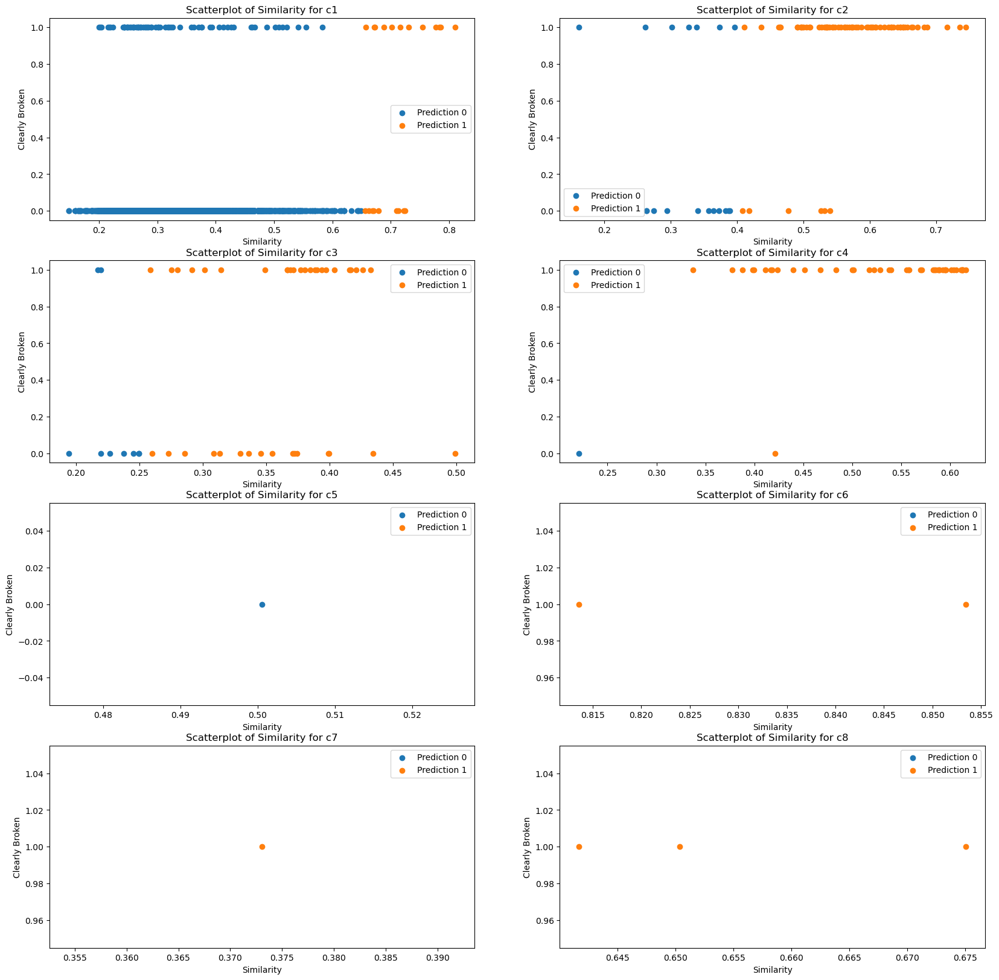

In [32]:
# get f1 score on 6p data
fig, axes = plt.subplots(4, 2, figsize=(20, 20))
cluster_f1 = {}
i = 0
for cluster in cluster_map.keys():
    cluster_data = anomaly[anomaly.cluster == cluster]
    cluster_data.loc[cluster_data.similarity>best_thresholds[cluster],'pred'] = 1
    anomaly.loc[(anomaly.cluster == cluster)&(anomaly.similarity>best_thresholds[cluster]),'pred'] = 1
    # predictions = np.ones(len(cluster_data), dtype=int)
    # cluster_f1[cluster] = f1_score(cluster_data['clearly_broken'], predictions)
# for ax, (group_name, group_data) in zip(axes.flatten(), anomaly.groupby('cluster')):
    ax = axes[i // 2, i % 2]
    for pred in (0,1):
        subset = cluster_data[cluster_data['pred'] == pred]
        ax.scatter(subset['similarity'], subset['clearly_broken'], label=f'Prediction {pred}')
    ax.set_ylabel('Clearly Broken')
    ax.set_xlabel('Similarity')
    ax.set_title(f'Scatterplot of Similarity for {cluster}')
    ax.legend()
    i += 1
plt.show()


In [33]:
f1_score(anomaly.clearly_broken, anomaly.pred)

0.7414634146341464

In [212]:
anomaly[anomaly.pred==1]['clearly_broken'].sum()

152

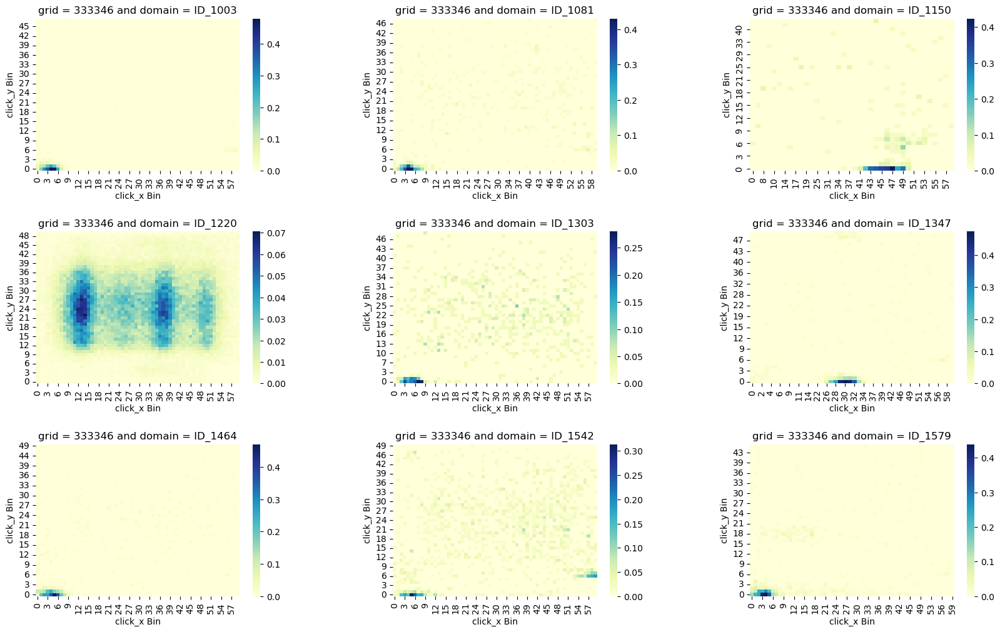

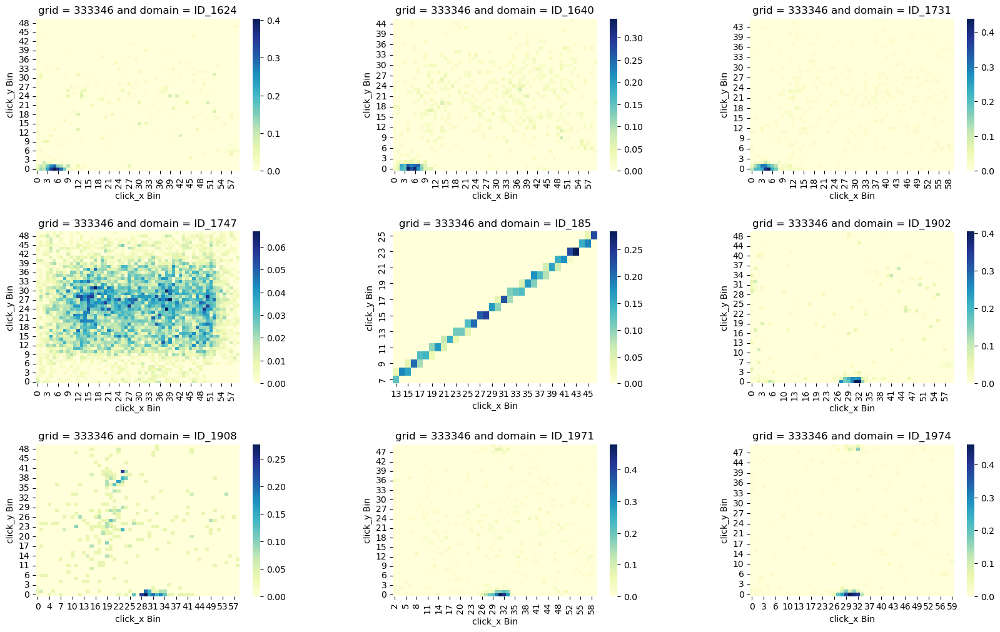

KeyboardInterrupt: 

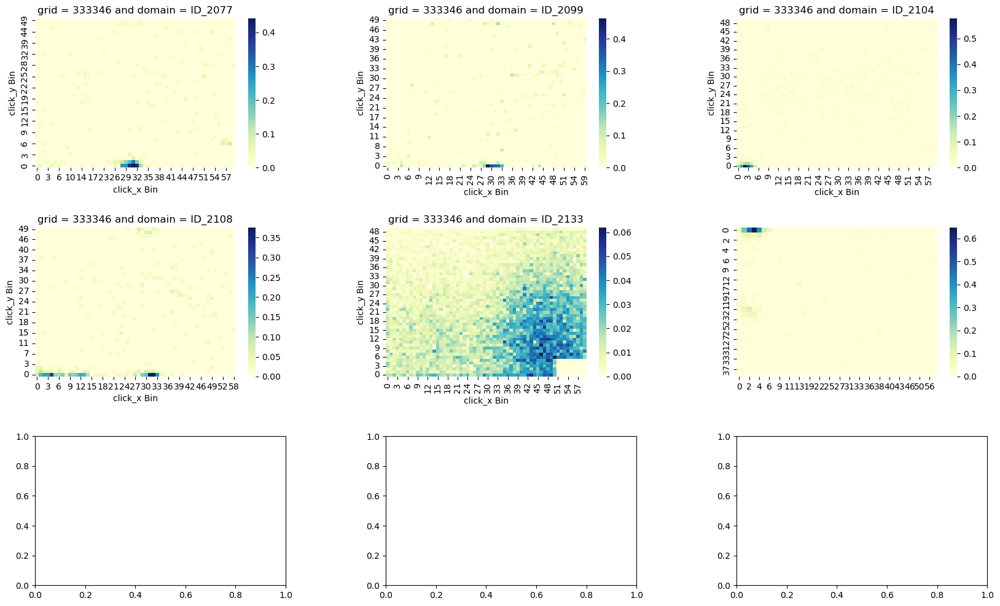

In [209]:
plot_anomaly(3,3,anomaly[anomaly.pred==1][['grid_id','domain']].to_numpy(), df_new)

In [18]:
# fig, axes = plt.subplots(4, 2, figsize=(20, 20))
# for ax, (group_name, group_data) in zip(axes.flatten(), anomaly.groupby('cluster')):
#     ax.scatter(group_data['similarity'], group_data['clearly_broken'])
#     ax.set_ylabel('Clearly Broken')
#     ax.set_xlabel('Similarity')
#     ax.set_title(f'Scatterplot of Similarity for {group_name}')
# plt.show()


# Representative banner + Uniform Center + Border

In [31]:
cb_333346_6p = ['ID_106', 'ID_1003', 'ID_1081', 'ID_1108', 'ID_1111', 'ID_1150', 'ID_1217', 'ID_1303', 'ID_1347', 
                'ID_136', 'ID_1464', 'ID_1542', 'ID_1579', 'ID_1589', 'ID_1602', 'ID_1624','ID_1640', 'ID_1731',
                'ID_185', 'ID_1902', 'ID_1908', 'ID_1915', 'ID_1916', 'ID_1917','ID_1971', 'ID_1974', 'ID_2015', 
                'ID_2063', 'ID_2077', 'ID_2099', 'ID_2104', 'ID_2108', 'ID_2133', 'ID_2143', 'ID_2214', 'ID_2242',
                'ID_2279', 'ID_2336', 'ID_2337', 'ID_2368', 'ID_2400', 'ID_2404', 'ID_243', 'ID_2435', 'ID_245', 
                'ID_2553', 'ID_2564', 'ID_2598', 'ID_2626', 'ID_2627', 'ID_2635', 'ID_2636', 'ID_2648', 'ID_267', 
                'ID_2693', 'ID_27', 'ID_2737', 'ID_2750', 'ID_2760', 'ID_2762', 'ID_2766', 'ID_2779', 'ID_2809', 
                'ID_2867', 'ID_2881', 'ID_2924', 'ID_2933', 'ID_2977', 'ID_3019', 'ID_3098', 'ID_313', 'ID_3157', 
                'ID_3172', 'ID_3178', 'ID_3219', 'ID_3231', 'ID_324', 'ID_3268', 'ID_3308', 'ID_333', 'ID_3334', 
                'ID_3375', 'ID_3389', 'ID_3405', 'ID_3418', 'ID_3472', 'ID_3487', 'ID_3526', 'ID_3535', 'ID_3567',
                'ID_3605', 'ID_3614', 'ID_362', 'ID_3633', 'ID_3640', 'ID_3644', 'ID_365', 'ID_367', 'ID_3672', 
                'ID_3699', 'ID_3726', 'ID_3730', 'ID_3781', 'ID_3799', 'ID_3800', 'ID_3809', 'ID_3837', 'ID_3848', 
                'ID_3850', 'ID_389', 'ID_3917', 'ID_3920', 'ID_3939', 'ID_3982', 'ID_401', 'ID_4016', 'ID_4040',
                'ID_4042', 'ID_4058', 'ID_4072', 'ID_4076', 'ID_4199', 'ID_4204', 'ID_4206', 'ID_4224', 'ID_4275',
                'ID_429', 'ID_4347', 'ID_4378', 'ID_4507', 'ID_4567','ID_466', 'ID_494', 'ID_514', 'ID_539', 
                'ID_582', 'ID_62', 'ID_71', 'ID_727', 'ID_731', 'ID_737', 'ID_825', 'ID_861', 'ID_869', 'ID_876', 
                'ID_889', 'ID_90', 'ID_922', 'ID_949', 'ID_969', 'ID_979', 'ID_981', 'ID_993']
cb_333519_6p = ['ID_1081', 'ID_1150', 'ID_1464', 'ID_1518', 'ID_1622', 'ID_1623', 'ID_1624', 'ID_1631', 'ID_1678', 
                'ID_1623', 'ID_1731', 'ID_1752', 'ID_1764', 'ID_1795', 'ID_1915', 'ID_1916', 'ID_1971', 'ID_198', 
                'ID_2018', 'ID_204', 'ID_2044', 'ID_2104', 'ID_2108', 'ID_2109', 'ID_2146', 'ID_2251', 'ID_2330', 
                'ID_2336', 'ID_2381', 'ID_2383', 'ID_2400', 'ID_2616', 'ID_2636', 'ID_2749', 'ID_2766', 'ID_2779', 
                'ID_2809', 'ID_284', 'ID_2875', 'ID_2881', 'ID_30', 'ID_3021', 'ID_3049', 'ID_3098', 'ID_3178', 
                'ID_3183', 'ID_3219', 'ID_3232', 'ID_3561', 'ID_3644', 'ID_365', 'ID_3850', 'ID_389', 'ID_4025', 
                'ID_4036', 'ID_4050', 'ID_4058', 'ID_4075', 'ID_4113', 'ID_4122', 'ID_4255', 'ID_4257', 'ID_4275', 
                'ID_4347', 'ID_44', 'ID_4506', 'ID_4567', 'ID_618', 'ID_727', 'ID_737', 'ID_922', 'ID_950', 'ID_960', 
                'ID_969']

In [15]:
cluster_map = {}

In [16]:
# manually create a uniform center
from itertools import product

BOXES_FROM_BDRY = 5

data = pd.DataFrame(list(product(range(0,60),range(0,50))), 
                    columns=['click_x_bin', 'click_y_bin'])

data['clicks'] = 1
data.loc[data.click_x_bin < BOXES_FROM_BDRY, 'clicks'] = 0
data.loc[data.click_y_bin < BOXES_FROM_BDRY, 'clicks'] = 0
data.loc[data.click_x_bin > data.click_x_bin.max() - BOXES_FROM_BDRY, 'clicks'] = 0
data.loc[data.click_y_bin > data.click_y_bin.max() - BOXES_FROM_BDRY, 'clicks'] = 0

data['clicks'] = data['clicks']/data.clicks.sum()
data['clicks'] = data['clicks']/np.sqrt(np.square(data['clicks']).sum(axis=0))

In [17]:
np.linalg.norm(data.clicks)

1.0000000000000002

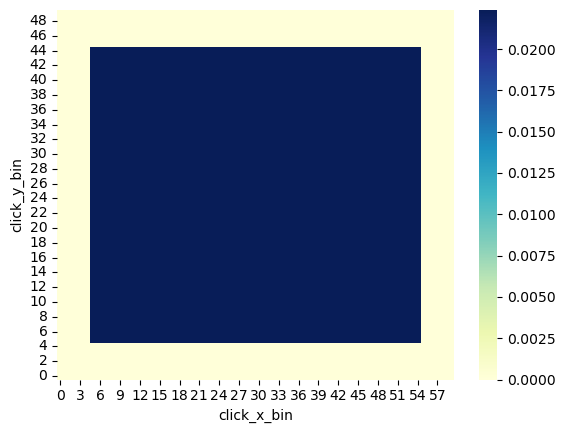

In [18]:
sns.heatmap(data.pivot("click_y_bin", "click_x_bin", "clicks").fillna(0), cmap="YlGnBu", annot=False, cbar=True, fmt="g")
plt.gca().invert_yaxis()
plt.show()

In [19]:
current_map = np.zeros((50, 60))
for _, row in data.iterrows():
    current_map[int(row['click_y_bin']), int(row['click_x_bin'])] = row['clicks']
cluster_map['uniform_center'] = current_map

In [20]:
# border case
boxes_from_left = 5
boxes_from_right = 4
boxes_from_top = 5
boxes_from_bottom = 3
data = pd.DataFrame(list(product(range(0,60),range(0,50))), 
                    columns=['click_x_bin', 'click_y_bin'])

data['clicks'] = 0
data.loc[data.click_x_bin < boxes_from_left, 'clicks'] = 1
data.loc[data.click_y_bin < boxes_from_bottom, 'clicks'] = 1
data.loc[data.click_x_bin > data.click_x_bin.max() - boxes_from_right, 'clicks'] = 1
data.loc[data.click_y_bin > data.click_y_bin.max() - boxes_from_top, 'clicks'] = 1

data['clicks'] = data['clicks']/data.clicks.sum()
data['clicks'] = data['clicks']/np.sqrt(np.square(data['clicks']).sum(axis=0))

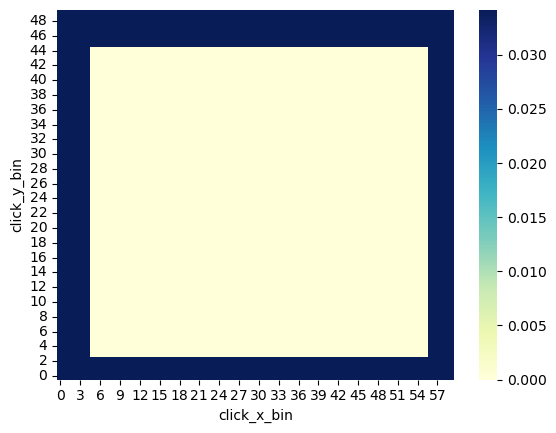

In [21]:
sns.heatmap(data.pivot("click_y_bin", "click_x_bin", "clicks").fillna(0), cmap="YlGnBu", annot=False, cbar=True, fmt="g")
plt.gca().invert_yaxis()
plt.show()

In [22]:
current_map = np.zeros((50, 60))
for _, row in data.iterrows():
    current_map[int(row['click_y_bin']), int(row['click_x_bin'])] = row['clicks']
cluster_map['border'] = current_map

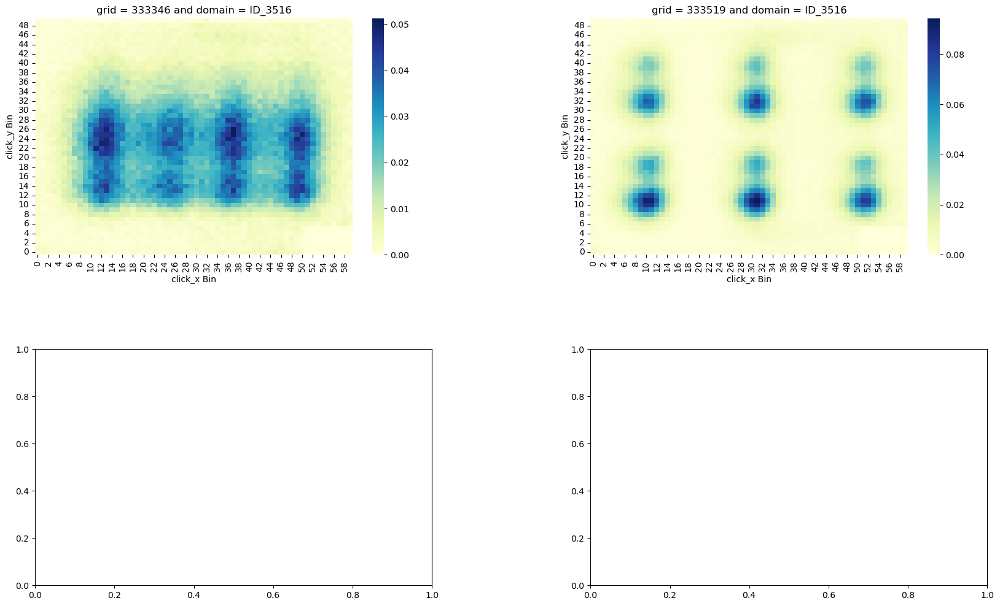

In [32]:
# representative good banners
plot_anomaly(2,2,[(333346, 'ID_3516'), (333519, 'ID_3516')], df_new)

In [23]:
current_map = np.zeros((50, 60))
for _, row in df_new[(df_new.grid_id==333346)&(df_new.domain=='ID_3516')].iterrows():
    current_map[int(row['click_y_bin']), int(row['click_x_bin'])] = row['clicks_sum']
cluster_map['rep_333346_6p'] = current_map

In [24]:
current_map = np.zeros((50, 60))
for _, row in df_new[(df_new.grid_id==333519)&(df_new.domain=='ID_3516')].iterrows():
    current_map[int(row['click_y_bin']), int(row['click_x_bin'])] = row['clicks_sum']
cluster_map['rep_333519_6p'] = current_map

In [25]:
# similarity between each heatmap in 6p data and cluster_map
sim = []

groups = df_new.groupby(['grid_id', 'domain'])
for (grid_id, domain), group in groups:
    current_df = df_new[(df_new.grid_id==grid_id) & (df_new.domain == domain)]
    current_map = np.zeros((50, 60))
    for _, row in current_df.iterrows():
        current_map[row['click_y_bin'], row['click_x_bin']] = row['clicks_sum']

    for cluster, previous_map in cluster_map.items():
        similarity = cosine_similarity(current_map.flatten(), previous_map.flatten()) # cosine similarity
        sim.append((grid_id, domain, cluster, similarity))

In [26]:
sim = pd.DataFrame(sim, columns=['grid_id', 'domain', 'cluster', 'similarity'])

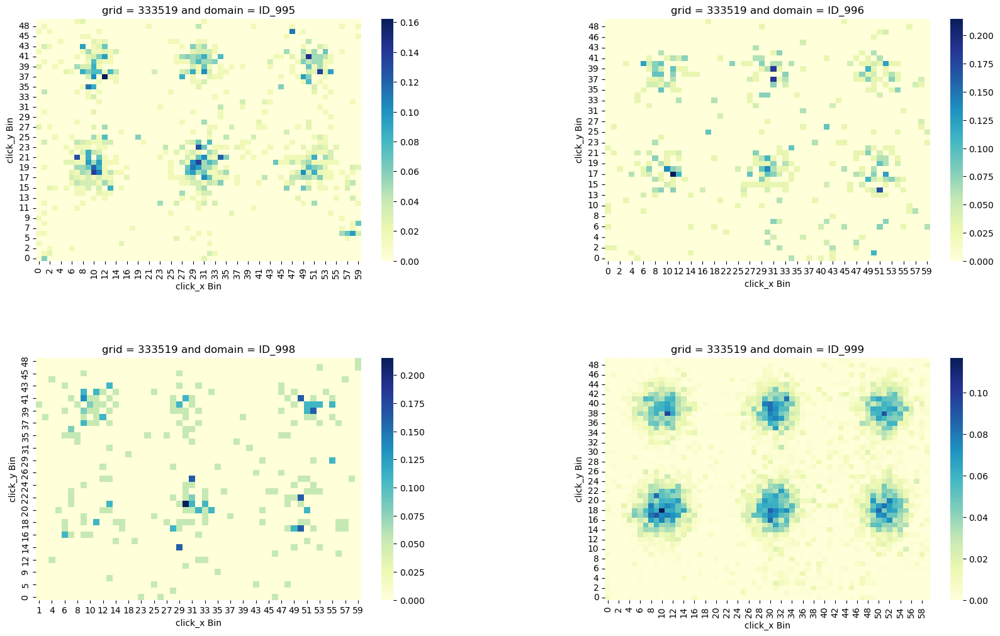

In [119]:
plot_anomaly(2,2,[(333519, 'ID_995'), (333519, 'ID_996'), (333519, 'ID_998'), (333519, 'ID_999')], df_new)

In [27]:
pivot_sim = sim.pivot_table(index=['grid_id', 'domain'], columns='cluster', values='similarity')
pivot_sim.reset_index(inplace=True)
pivot_sim.columns.name = None
# pivot_sim.columns = [str(col) for col in pivot_sim.columns]
pivot_sim

,grid_id,domain,border,rep_333346_6p,rep_333519_6p,uniform_center
0,333346,ID_1003,0.143525,0.024400,0.017318,0.014418
1,333346,ID_1007,0.076143,0.524387,0.262095,0.471543
2,333346,ID_1013,0.065865,0.415518,0.224712,0.385639
3,333346,ID_1022,0.021645,0.343187,0.181253,0.286124
4,333346,ID_1030,0.008676,0.359470,0.182975,0.287676
...,...,...,...,...,...,...
3025,333519,ID_994,0.023073,0.365467,0.459335,0.410172
3026,333519,ID_995,0.064131,0.344411,0.392879,0.375366
3027,333519,ID_996,0.055523,0.258649,0.341503,0.304996
3028,333519,ID_998,0.036747,0.229422,0.259788,0.261744


In [28]:
pivot_sim.describe()

,grid_id,border,rep_333346_6p,rep_333519_6p,uniform_center
count,3030.000000,3030.000000,3030.000000,3030.000000,3030.000000
mean,333463.674257,0.050176,0.344507,0.348363,0.354116
std,80.700465,0.040622,0.133454,0.146893,0.118320
min,333346.000000,0.000000,0.013084,0.010472,0.005258
25%,333346.000000,0.027913,0.258854,0.245948,0.280459
50%,333519.000000,0.038943,0.325893,0.336907,0.335796
75%,333519.000000,0.056106,0.404114,0.442028,0.419992
max,333519.000000,0.470306,1.000000,1.000000,0.843615


In [41]:
# get the best thresholds for each cluster according to f1 score(for each cluster) on 6p data
from sklearn.metrics import f1_score

pivot_sim['clearly_broken'] = 0
pivot_sim['pred'] = 0
pivot_sim.loc[(pivot_sim.grid_id  == 333519) & (pivot_sim.domain.isin(cb_333519_6p)), 'clearly_broken'] = 1
pivot_sim.loc[(pivot_sim.grid_id  == 333346) & (pivot_sim.domain.isin(cb_333346_6p)), 'clearly_broken'] = 1

max_f1 = 0
for threshold1 in np.arange(0.1, 0.2, 0.01):
    for threshold2 in np.arange(0.8, 0.9, 0.01):
        for threshold3 in np.arange(0.1, 0.2, 0.01):
            for threshold4 in np.arange(0.05, 0.15, 0.01):
                    # for threshold5 in np.arange(0.1, 0.7, 0.1):
                        # for threshold6 in np.arange(0.1, 0.8, 0.1):
                            anomaly = pivot_sim.copy()
                            anomaly.loc[anomaly['border'] > threshold1, 'pred'] = 1
                            anomaly.loc[anomaly['uniform_center'] > threshold2, 'pred'] = 1
                            anomaly.loc[anomaly['rep_333346_6p'] < threshold3, 'pred'] = 1
                            anomaly.loc[anomaly['rep_333519_6p'] < threshold4, 'pred'] = 1

                            # anomaly.loc[(anomaly['uniform_center'] < threshold2) & (anomaly['rep_333346_6p'] > threshold3), 'pred'] = 0
                            # anomaly.loc[(anomaly['uniform_center'] < threshold4) & (anomaly['rep_333519_6p'] > threshold5), 'pred'] = 0
                            
                            f1 = f1_score(anomaly['clearly_broken'], anomaly['pred'])
                            if f1 > max_f1:
                                best_thresholds = [threshold1, threshold2, threshold3, threshold4]
                                max_f1 = f1

In [42]:
max_f1, best_thresholds

(0.781038374717833,
 [0.13, 0.8500000000000001, 0.14999999999999997, 0.11000000000000001])

In [43]:
pivot_sim.loc[pivot_sim['border'] > best_thresholds[0], 'pred'] = 1
pivot_sim.loc[pivot_sim['uniform_center'] > best_thresholds[1], 'pred'] = 1
pivot_sim.loc[pivot_sim['rep_333346_6p'] <  best_thresholds[2], 'pred'] = 1
pivot_sim.loc[pivot_sim['rep_333519_6p'] < best_thresholds[3], 'pred'] = 1

fn = pivot_sim[(pivot_sim.clearly_broken==1)&(pivot_sim.pred==0)]
fp = pivot_sim[(pivot_sim.clearly_broken==0)&(pivot_sim.pred==1)]

In [46]:
# pivot_sim.loc[pivot_sim['border'] > best_thresholds[0], 'pred'] = 1
# pivot_sim.loc[pivot_sim['uniform_center'] > best_thresholds[5], 'pred'] = 1
# pivot_sim.loc[(pivot_sim['uniform_center'] < best_thresholds[1]) & (pivot_sim['rep_333346_6p'] > best_thresholds[2]), 'pred'] = 0
# pivot_sim.loc[(pivot_sim['uniform_center'] < best_thresholds[3]) & (pivot_sim['rep_333519_6p'] > best_thresholds[4]), 'pred'] = 0
# fn = pivot_sim[(pivot_sim.clearly_broken==1)&(pivot_sim.pred==0)]
# fp = pivot_sim[(pivot_sim.clearly_broken==0)&(pivot_sim.pred==1)]

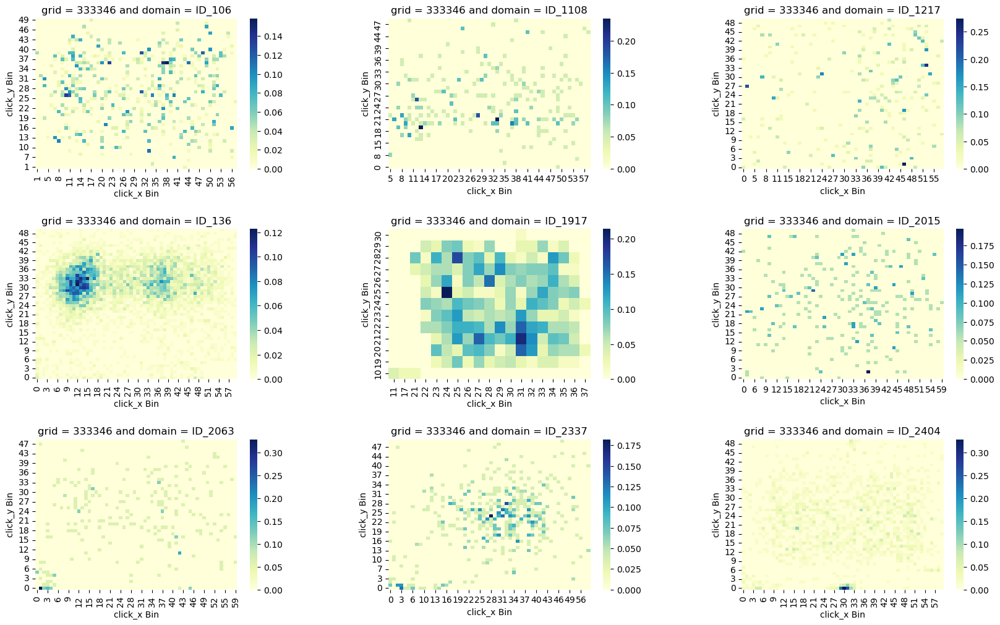

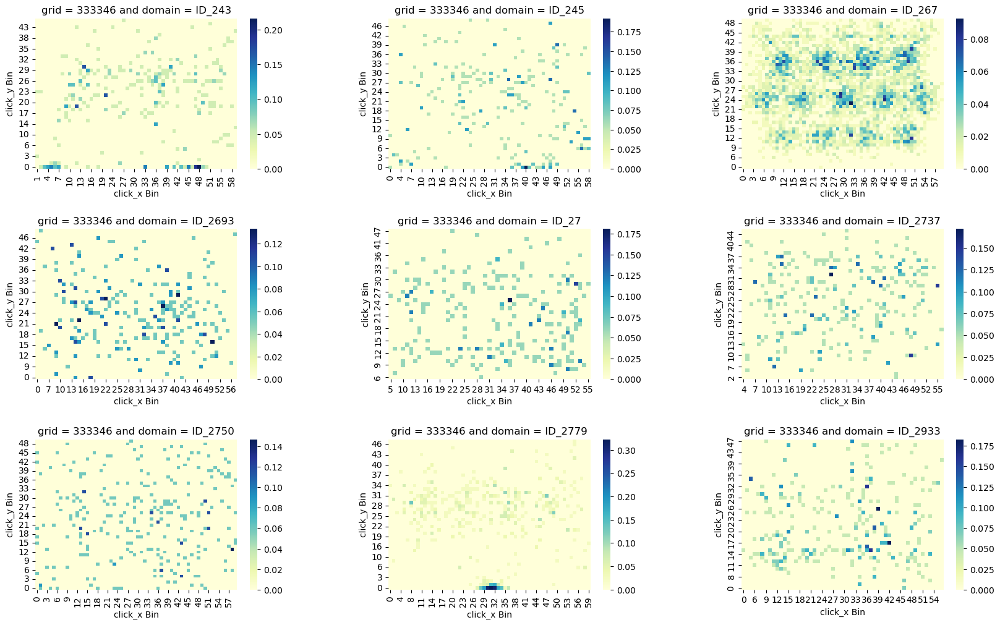

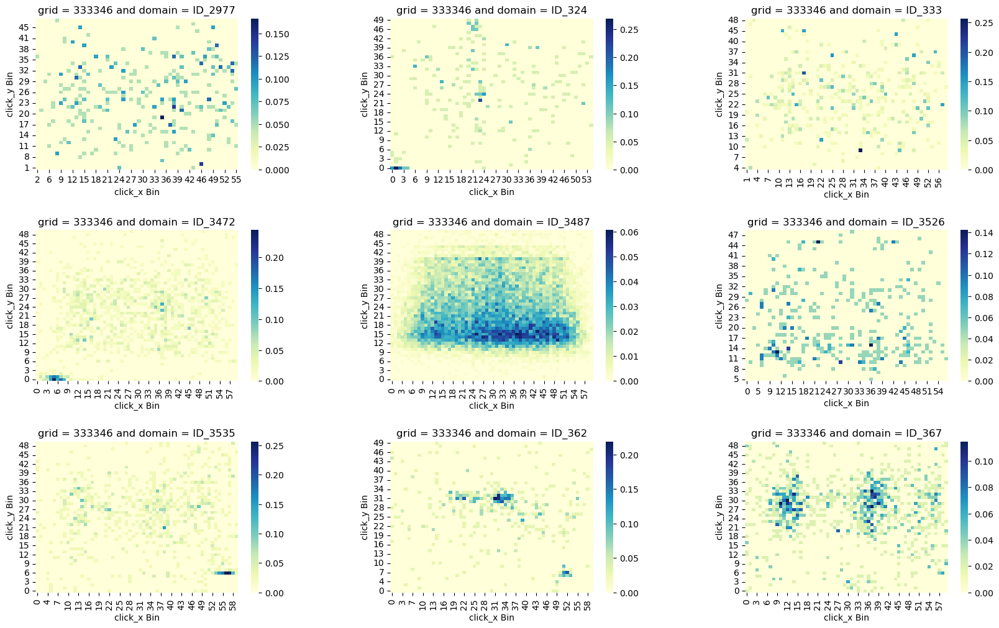

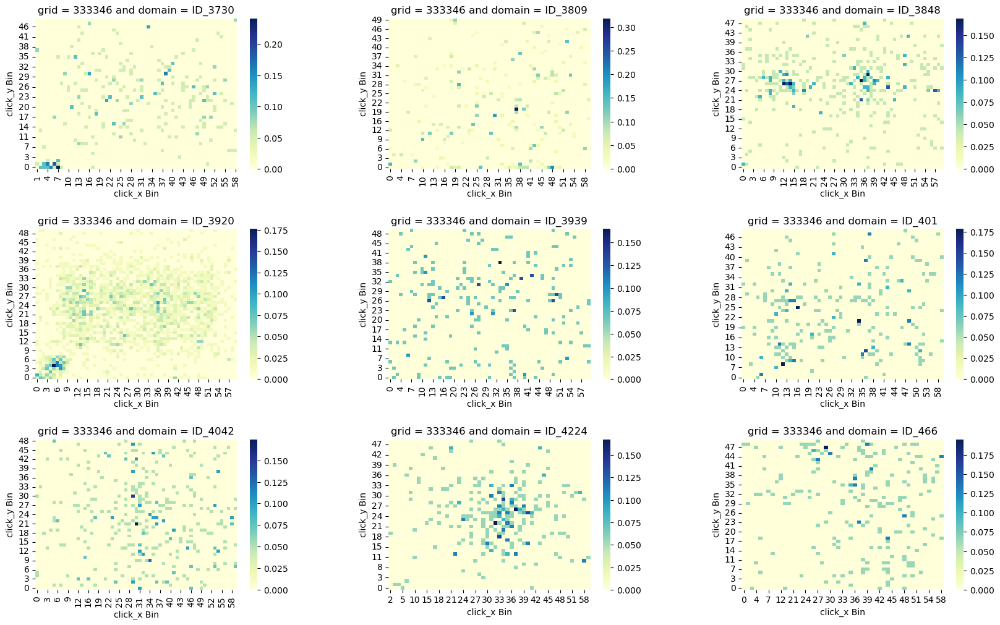

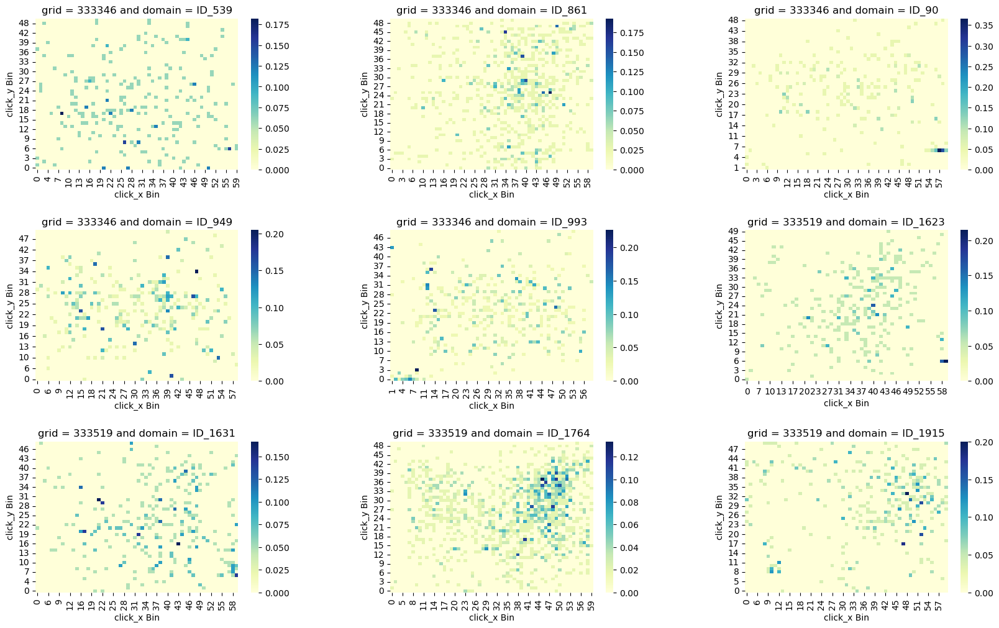

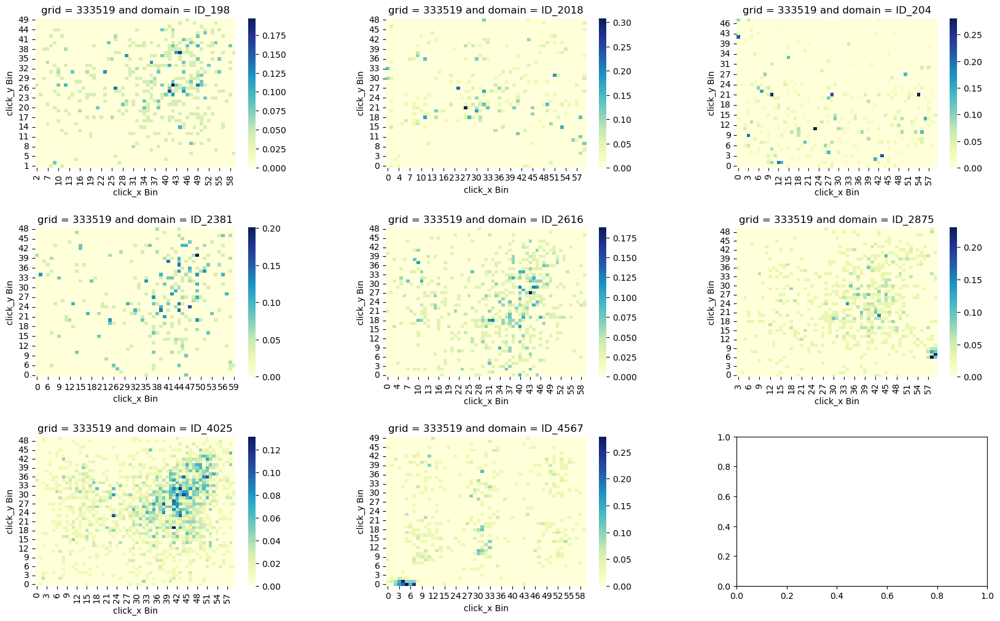

In [44]:
plot_anomaly(3,3,fn[['grid_id','domain']].to_numpy(), df_new)

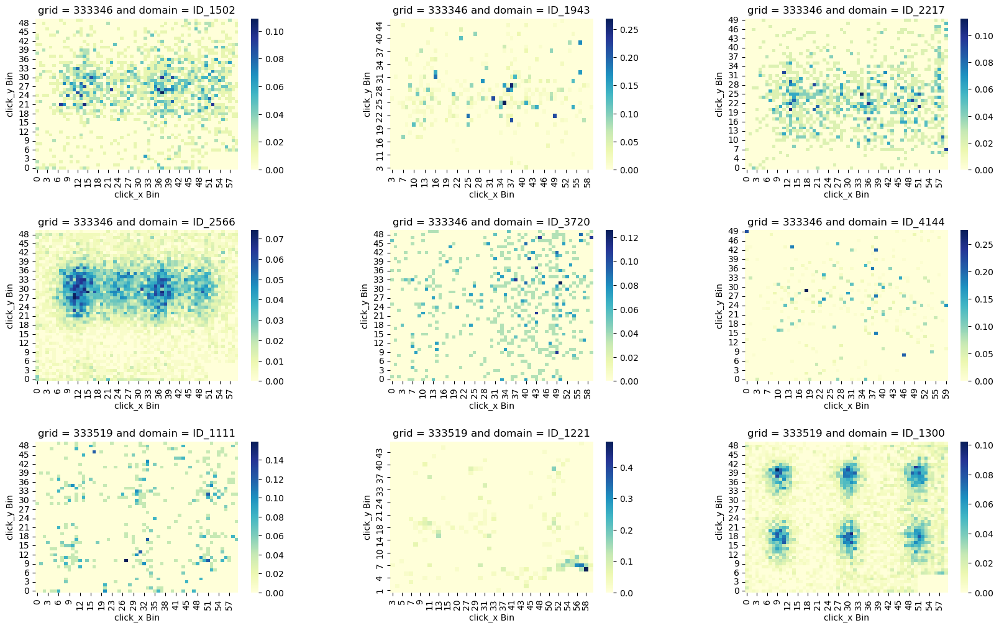

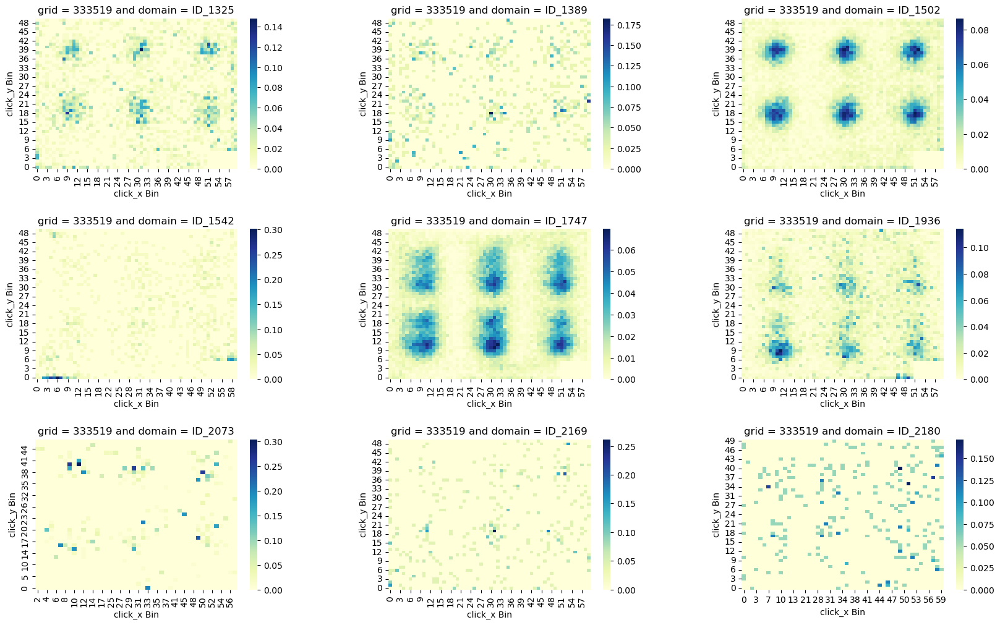

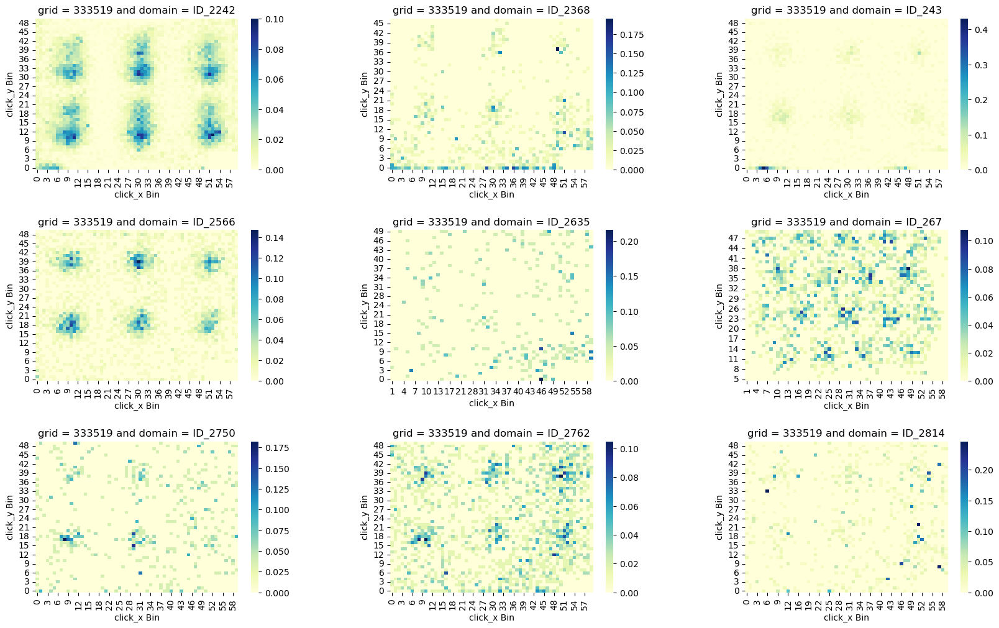

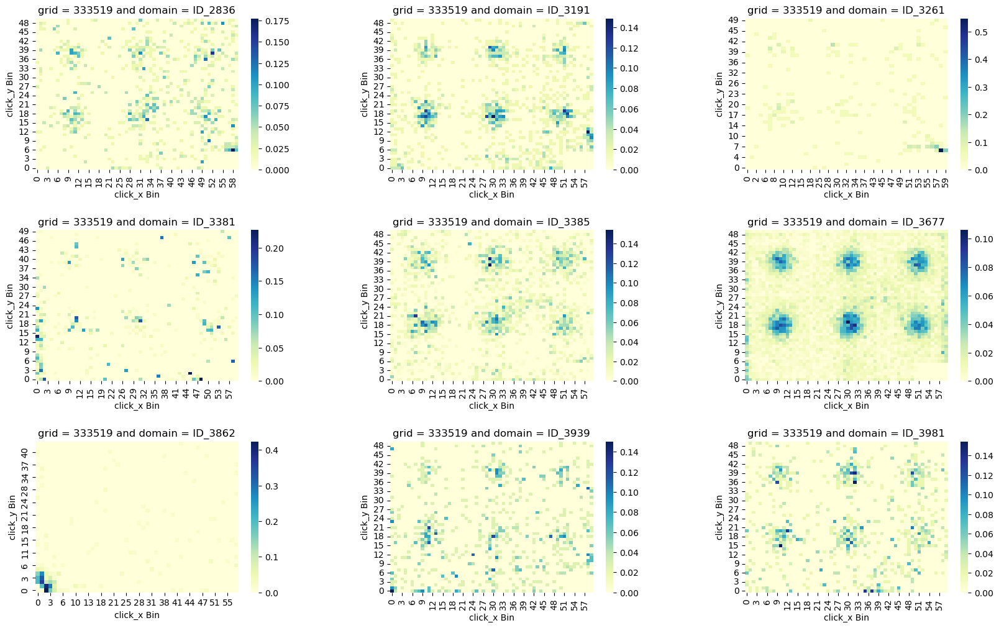

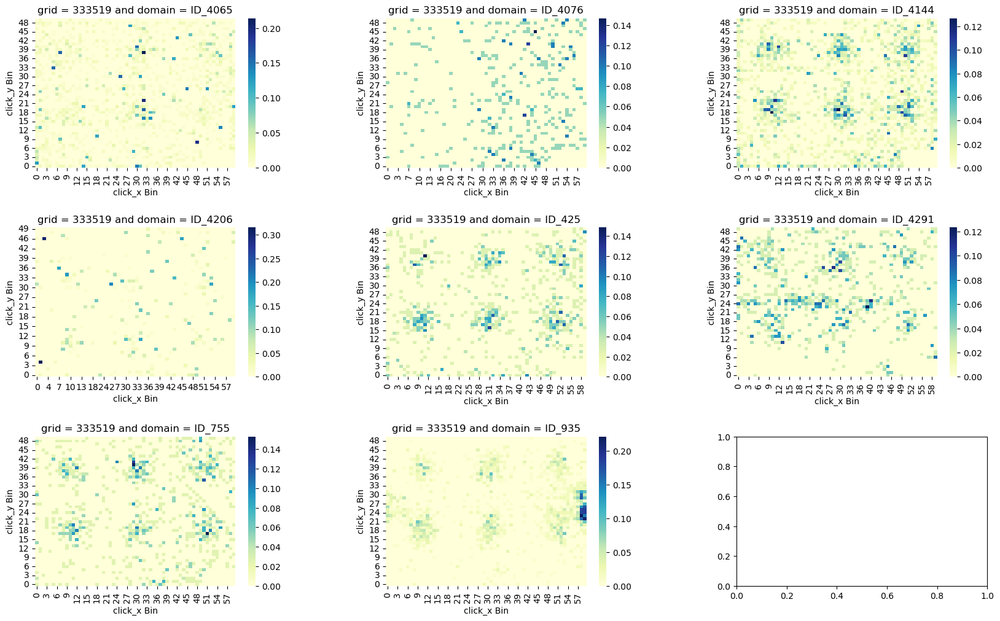

In [45]:
plot_anomaly(3,3,fp[['grid_id','domain']].to_numpy(), df_new)

In [58]:
# upsampling for each banner
def enhance_data(data, prob, size, sdev):
    indices = np.random.choice(data.index, size, replace=True, p = data[prob])
    
    pert_x = np.random.normal(0, sdev, size).round().astype(int)
    pert_y = np.random.normal(0, sdev, size).round().astype(int)

    x = data.loc[indices][['click_x_bin', 'click_y_bin']] + np.array((pert_x, pert_y)).reshape(-1,2)
    x_bin_max = data['click_x_bin'].max()
    y_bin_max = data['click_y_bin'].max()

    x[x['click_x_bin'] < 0]['click_x_bin'] = 0
    x[x['click_y_bin'] < 0]['click_y_bin'] = 0
    x[x['click_x_bin'] > x_bin_max]['click_x_bin'] = x_bin_max
    x[x['click_y_bin'] > y_bin_max]['click_y_bin'] = y_bin_max
        
    x = x.groupby(['click_x_bin','click_y_bin']).size().reset_index(name = 'clicks_sum')

    tt = pd.DataFrame(list(product(range(0,60), range(0,50))), columns=['click_x_bin', 'click_y_bin'])

    data_obs_merged = tt.merge(x, on = ['click_x_bin','click_y_bin'], how = 'left').fillna(0)
    # data_obs_merged['boots_clicks'].sum()
    return data_obs_merged

In [83]:
df_new

,grid_id,domain,click_x_bin,click_y_bin,clicks_sum
0,333346,ID_1003,0,0,0.055014
1,333346,ID_1003,0,1,0.058852
2,333346,ID_1003,0,2,0.021750
3,333346,ID_1003,0,3,0.005118
4,333346,ID_1003,0,5,0.002559
...,...,...,...,...,...
1666822,333519,ID_999,59,40,0.001712
1666823,333519,ID_999,59,41,0.001141
1666824,333519,ID_999,59,42,0.000571
1666825,333519,ID_999,59,45,0.002853


In [92]:
clicks_data = data_heatmap_expanded.groupby(['grid_id', 'domain', 'click_x_bin', 'click_y_bin']).size().reset_index(name='clicks_sum')
groups = df_new.groupby(['grid_id', 'domain'])
sim_enhance = []
for (grid_id, domain), group in groups:

    data_obs = clicks_data[(clicks_data.grid_id == grid_id) & (clicks_data.domain == domain)]
    data_obs['proba'] = data_obs['clicks_sum']/data_obs['clicks_sum'].sum()
    data_obs_enh = enhance_data(data_obs, 'proba', 10000, 1.5)

    data_obs_enh['clicks_sum'] = data_obs_enh['clicks_sum'] / data_obs_enh['clicks_sum'].sum()
    data_obs_enh['clicks_sum'] = data_obs_enh['clicks_sum'] / math.sqrt((data_obs_enh['clicks_sum']**2).sum())
    
    current_map = data_obs_enh.pivot(index='click_x_bin', columns='click_y_bin', values='clicks_sum').values
    for cluster, previous_map in cluster_map.items():
        similarity = cosine_similarity(current_map.flatten(), previous_map.flatten()) # cosine similarity
        sim_enhance.append((grid_id, domain, cluster, similarity))

/var/folders/v5/fdchv5291q33jr6kh3mvl3yr0000gn/T/ipykernel_4912/1581229458.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_obs['proba'] = data_obs['clicks_sum']/data_obs['clicks_sum'].sum()
/var/folders/v5/fdchv5291q33jr6kh3mvl3yr0000gn/T/ipykernel_4912/2536084752.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[x['click_x_bin'] < 0]['click_x_bin'] = 0
/var/folders/v5/fdchv5291q33jr6kh3mvl3yr0000gn/T/ipykernel_4912/2536084752.py:13: SettingWithCopyWarning: 
A value is trying to be set on a co

In [95]:
sim_enhance = pd.DataFrame(sim_enhance, columns=['grid_id', 'domain', 'cluster', 'similarity'])
pivot_sim_enhance = sim_enhance.pivot_table(index=['grid_id', 'domain'], columns='cluster', values='similarity')
pivot_sim_enhance.reset_index(inplace=True)
pivot_sim_enhance.columns.name = None
pivot_sim_enhance

,grid_id,domain,border,rep_333346_6p,rep_333519_6p,uniform_center
0,333346,ID_1003,0.135959,0.034075,0.037957,0.042578
1,333346,ID_1007,0.239677,0.562893,0.484532,0.610254
2,333346,ID_1013,0.232075,0.513155,0.414676,0.564578
3,333346,ID_1022,0.211259,0.537562,0.431111,0.595320
4,333346,ID_1030,0.171986,0.519675,0.412472,0.568146
...,...,...,...,...,...,...
3025,333519,ID_994,0.188727,0.355072,0.272956,0.457841
3026,333519,ID_995,0.226885,0.384335,0.270212,0.468500
3027,333519,ID_996,0.219386,0.376291,0.267977,0.481021
3028,333519,ID_998,0.213176,0.368475,0.280316,0.446045


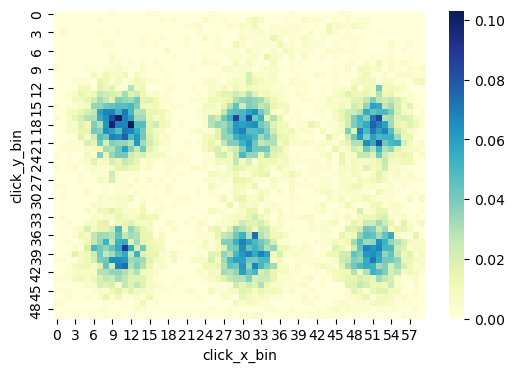

In [107]:
data_obs = clicks_data[(clicks_data.grid_id == 333519) & (clicks_data.domain == 'ID_999')]
data_obs['proba'] = data_obs['clicks_sum']/data_obs['clicks_sum'].sum()
data_obs_enh = enhance_data(data_obs, 'proba', 10000, 1.5)

data_obs_enh['clicks_sum'] = data_obs_enh['clicks_sum'] / data_obs_enh['clicks_sum'].sum()
data_obs_enh['clicks_sum'] = data_obs_enh['clicks_sum'] / math.sqrt((data_obs_enh['clicks_sum']**2).sum())
click_matrix = data_obs_enh.pivot("click_y_bin", "click_x_bin", "clicks_sum").fillna(0)
plt.figure(figsize = (6,4))
sns.heatmap(click_matrix, cmap="YlGnBu", annot=False, cbar=True, fmt="g")
plt.show()

In [109]:
# get the best thresholds for each cluster according to f1 score(for each cluster) on 6p data
from sklearn.metrics import f1_score

pivot_sim_enhance['clearly_broken'] = 0
pivot_sim_enhance['pred'] = 0
pivot_sim_enhance.loc[(pivot_sim_enhance.grid_id  == 333519) & (pivot_sim_enhance.domain.isin(cb_333519_6p)), 'clearly_broken'] = 1
pivot_sim_enhance.loc[(pivot_sim_enhance.grid_id  == 333346) & (pivot_sim_enhance.domain.isin(cb_333346_6p)), 'clearly_broken'] = 1

max_f1 = 0
for threshold1 in np.arange(0.1, 0.5, 0.05):
    for threshold2 in np.arange(0.5, 0.9, 0.05):
        for threshold3 in np.arange(0.1, 0.5, 0.05):
            for threshold4 in np.arange(0.1, 0.5, 0.05):
                    # for threshold5 in np.arange(0.1, 0.7, 0.1):
                        # for threshold6 in np.arange(0.1, 0.8, 0.1):
                            anomaly = pivot_sim_enhance.copy()
                            anomaly.loc[anomaly['border'] > threshold1, 'pred'] = 1
                            anomaly.loc[anomaly['uniform_center'] > threshold2, 'pred'] = 1
                            anomaly.loc[anomaly['rep_333346_6p'] < threshold3, 'pred'] = 1
                            anomaly.loc[anomaly['rep_333519_6p'] < threshold4, 'pred'] = 1

                            # anomaly.loc[(anomaly['uniform_center'] < threshold2) & (anomaly['rep_333346_6p'] > threshold3), 'pred'] = 0
                            # anomaly.loc[(anomaly['uniform_center'] < threshold4) & (anomaly['rep_333519_6p'] > threshold5), 'pred'] = 0
                            
                            f1 = f1_score(anomaly['clearly_broken'], anomaly['pred'])
                            if f1 > max_f1:
                                best_thresholds = [threshold1, threshold2, threshold3, threshold4]
                                max_f1 = f1
max_f1, best_thresholds

(0.6734177215189874,
 [0.3500000000000001,
  0.7000000000000002,
  0.30000000000000004,
  0.20000000000000004])

In [111]:
pivot_sim_enhance.loc[pivot_sim_enhance['border'] > best_thresholds[0], 'pred'] = 1
pivot_sim_enhance.loc[pivot_sim_enhance['uniform_center'] > best_thresholds[1], 'pred'] = 1
pivot_sim_enhance.loc[pivot_sim_enhance['rep_333346_6p'] <  best_thresholds[2], 'pred'] = 1
pivot_sim_enhance.loc[pivot_sim_enhance['rep_333519_6p'] < best_thresholds[3], 'pred'] = 1

fn = pivot_sim_enhance[(pivot_sim_enhance.clearly_broken==1)&(pivot_sim_enhance.pred==0)]
fp = pivot_sim_enhance[(pivot_sim_enhance.clearly_broken==0)&(pivot_sim_enhance.pred==1)]


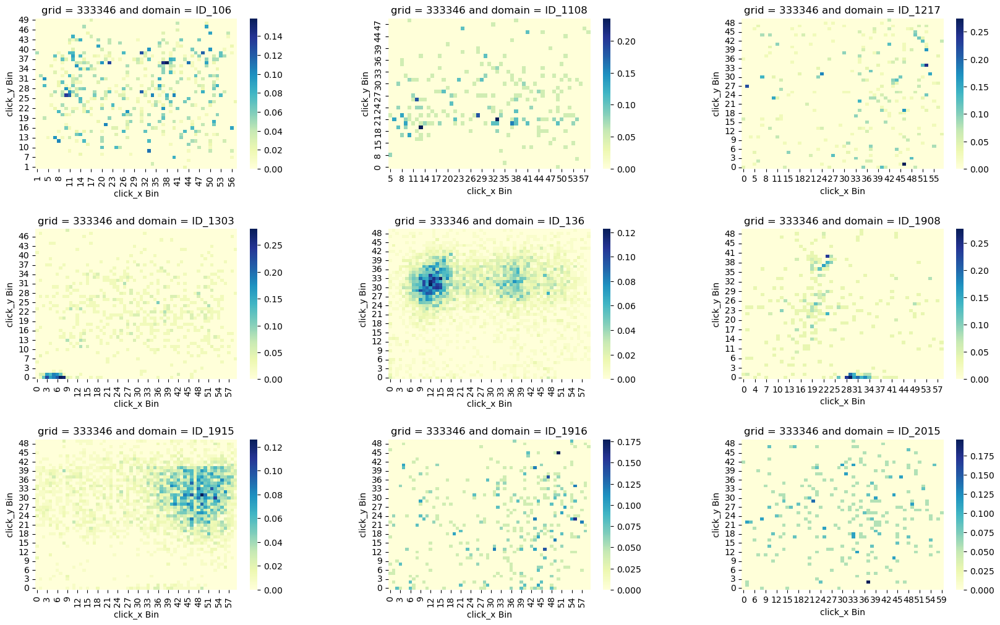

KeyboardInterrupt: 

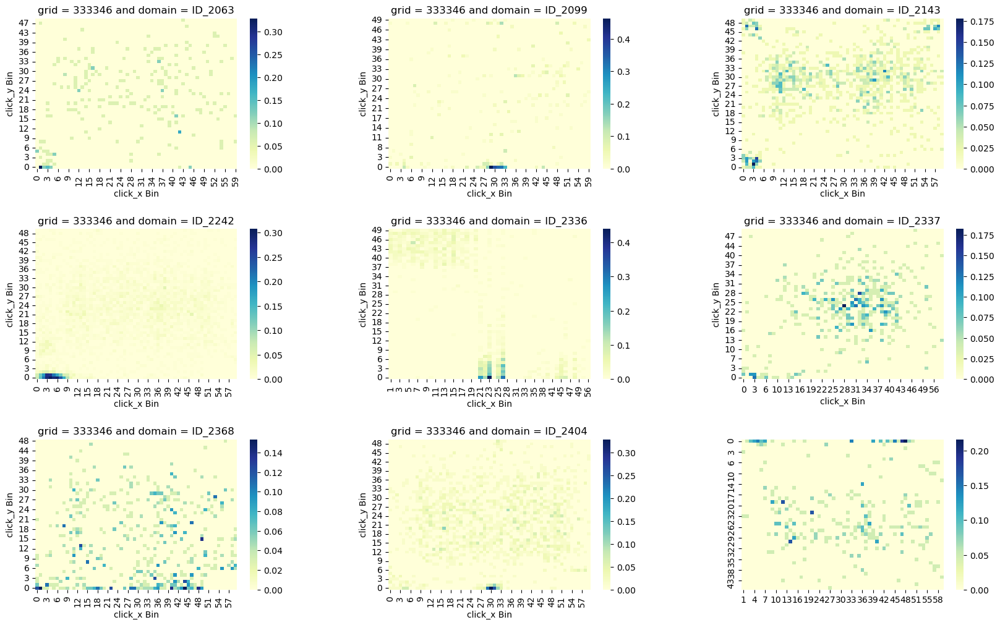

In [112]:
plot_anomaly(3,3,fn[['grid_id','domain']].to_numpy(), df_new)